# The following codes were created by Jing Jiang

## Step 1: Analysis dataset

### 1.1 Load and split dataset

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
# Load and split dataset
def load_data(file_path):
    train_features = pd.read_csv(file_path)
    sj_train_features = train_features[train_features['city'] == 'sj']
    iq_train_features = train_features[train_features['city'] == 'iq']
    return sj_train_features, iq_train_features

In [3]:
sj_train_features, iq_train_features = load_data("../data/raw/dengue_features_train.csv")
sj_train_labels, iq_train_labels = load_data("../data/raw/dengue_labels_train.csv")
sj_test_features, iq_test_features = load_data("../data/raw/dengue_features_test.csv")

In [4]:
# Check data shape
print('sj_train_features: ', sj_train_features.shape)
print('iq_train_features: ', iq_train_features.shape)

print('sj_train_labels: ', sj_train_labels.shape)
print('iq_train_labels: ', iq_train_labels.shape)

print('sj_test_features: ', sj_test_features.shape)
print('iq_test_features: ', iq_test_features.shape)

sj_train_features:  (936, 24)
iq_train_features:  (520, 24)
sj_train_labels:  (936, 4)
iq_train_labels:  (520, 4)
sj_test_features:  (260, 24)
iq_test_features:  (156, 24)


### 1.2 Descriptive Statistics
Check the mean, media and mode values of training dataset

In [5]:
from statistics import mode, multimode

# Define a function to calculate descriptive statistics
def descriptive_statistics(data):
    descriptives = {}
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        descriptives[column] = {
            'Mean': data[column].mean(),
            'Median': data[column].median(),
            'Mode': multimode(data[column].dropna())
        }
    return descriptives

In [6]:
# Calculate descriptive statistics for San Juan dataset
sj_descriptive_stats = descriptive_statistics(sj_train_features)
sj_descriptive_stats

{'year': {'Mean': 1998.826923076923,
  'Median': 1999.0,
  'Mode': [1991,
   1992,
   1993,
   1994,
   1995,
   1996,
   1997,
   1998,
   1999,
   2000,
   2001,
   2002,
   2003,
   2004,
   2005,
   2006,
   2007]},
 'weekofyear': {'Mean': 26.503205128205128,
  'Median': 26.5,
  'Mode': [18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17]},
 'ndvi_ne': {'Mean': 0.05792473383892618,
  'Median': 0.0577,
  'Mode': [0.0969, 0.0802, 0.0455]},
 'ndvi_nw': {'Mean': 0.06746906815219843,
  'Median': 0.068075,
  'Mode': [0.1127, 0.0278, 0.07825]},
 'ndvi_se': {'Mean': 0.17765518395092694,
  'Median': 0.1771857,
  'Mode': [0.1984833,
   0.1572,
   0.1515,
   0.1387429,
   0.1736714,
   0.2154143,
   0.146

In [7]:
# Calculate descriptive statistics for Iquitos dataset
iq_descriptive_stats = descriptive_statistics(iq_train_features)
sj_descriptive_stats

{'year': {'Mean': 1998.826923076923,
  'Median': 1999.0,
  'Mode': [1991,
   1992,
   1993,
   1994,
   1995,
   1996,
   1997,
   1998,
   1999,
   2000,
   2001,
   2002,
   2003,
   2004,
   2005,
   2006,
   2007]},
 'weekofyear': {'Mean': 26.503205128205128,
  'Median': 26.5,
  'Mode': [18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17]},
 'ndvi_ne': {'Mean': 0.05792473383892618,
  'Median': 0.0577,
  'Mode': [0.0969, 0.0802, 0.0455]},
 'ndvi_nw': {'Mean': 0.06746906815219843,
  'Median': 0.068075,
  'Mode': [0.1127, 0.0278, 0.07825]},
 'ndvi_se': {'Mean': 0.17765518395092694,
  'Median': 0.1771857,
  'Mode': [0.1984833,
   0.1572,
   0.1515,
   0.1387429,
   0.1736714,
   0.2154143,
   0.146

### 1.3 Visualize dataset

#### 1.3.1 Box plot

In [8]:
# Appending total_cases to training dataset
sj_train_features['total_cases'] = sj_train_labels.total_cases
iq_train_features['total_cases'] = iq_train_labels.total_cases

In [9]:
sj_train_features

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,sj,2008,13,2008-03-25,0.077850,-0.039900,0.310471,0.296243,27.19,296.958571,...,74.247143,27.19,13.644286,2.885714,25.042857,5.785714,30.0,21.1,1.8,4
932,sj,2008,14,2008-04-01,-0.038000,-0.016833,0.119371,0.066386,3.82,298.081429,...,74.600000,3.82,14.662857,2.714286,26.242857,6.814286,30.6,22.2,0.5,3
933,sj,2008,15,2008-04-08,-0.155200,-0.052750,0.137757,0.141214,16.96,297.460000,...,75.027143,16.96,14.184286,2.185714,25.000000,5.714286,29.4,21.7,30.7,1
934,sj,2008,16,2008-04-15,0.001800,NaN,0.203900,0.209843,0.00,297.630000,...,72.285714,0.00,13.858571,2.785714,25.314286,6.242857,29.4,21.7,11.2,3


In [10]:
# Define box plot function to check potential outliers 
def box_plot(dataset, features):
    plt.figure(figsize=(12, 15))
    for i, variable in enumerate(features, 1):
        plt.subplot(5, 4, i)
        sns.boxplot(x=dataset[variable])
        plt.title(f'{variable}')

    plt.tight_layout()
    plt.show()

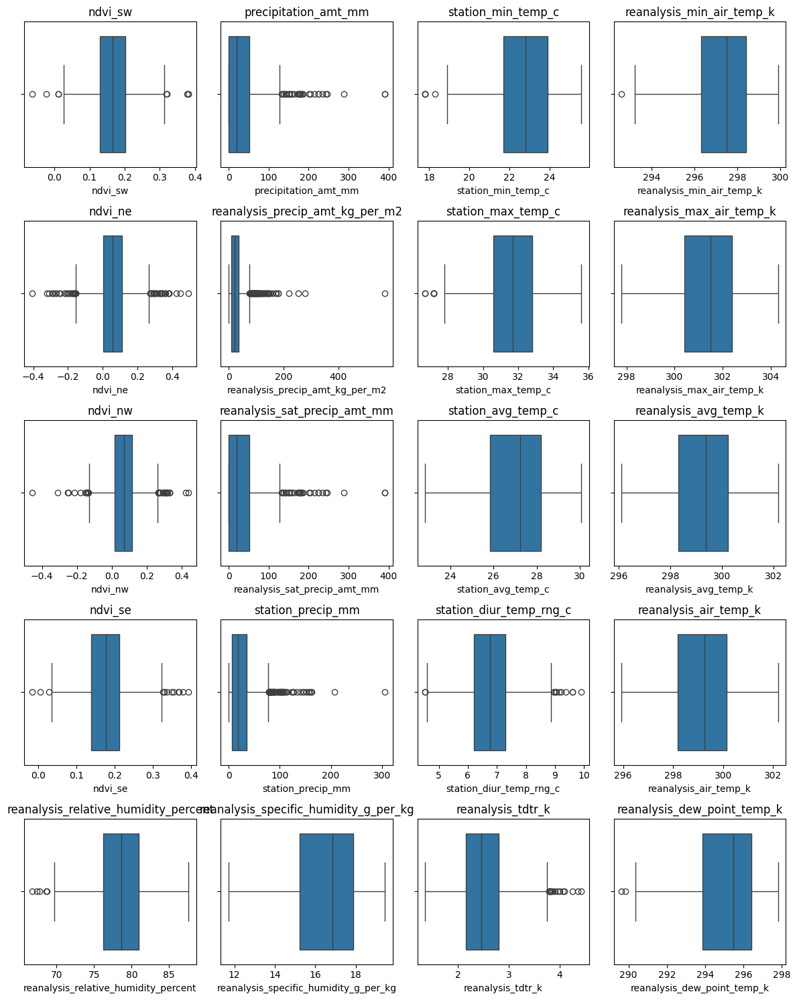

In [11]:
# Selecting features for box plot, except time and total_cases features
features = [
    'ndvi_sw', 'precipitation_amt_mm', 'station_min_temp_c', 'reanalysis_min_air_temp_k', 
    'ndvi_ne', 'reanalysis_precip_amt_kg_per_m2', 'station_max_temp_c', 'reanalysis_max_air_temp_k',
    'ndvi_nw', 'reanalysis_sat_precip_amt_mm', 'station_avg_temp_c', 'reanalysis_avg_temp_k', 
    'ndvi_se',  'station_precip_mm', 'station_diur_temp_rng_c', 'reanalysis_air_temp_k', 
    'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'reanalysis_dew_point_temp_k'
]

box_plot(sj_train_features, features)

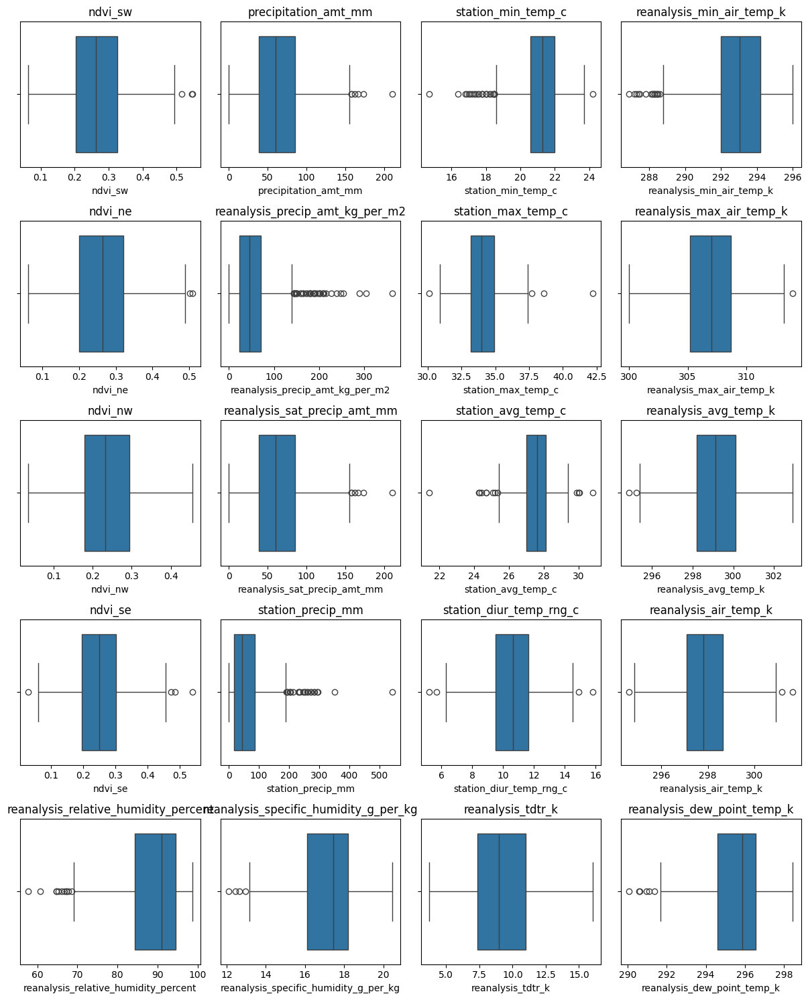

In [12]:
box_plot(iq_train_features, features)

### 1.4 Statistical Tests

#### 1.4.1 Normality Tests
Using Shapiro-Wilk test

In [13]:
from scipy.stats import shapiro

# Define function to apply Shapiro-Wilk test for normality
def test_normality(data):
    normality_results = {}
    for column in data.select_dtypes(include=['float64', 'int64']).columns:
        stat, p_value = shapiro(data[column].dropna())
        normality_results[column] = {'Statistic': stat, 'p-value': p_value}
    return normality_results

In [14]:
# Apply Shapiro-Wilk test to San Juan city
normality_test_results_reloaded = test_normality(sj_train_features)
normality_test_results_reloaded

{'year': {'Statistic': 0.9528900840123653, 'p-value': 9.567320593593171e-17},
 'weekofyear': {'Statistic': 0.9544244189986429,
  'p-value': 1.8869000675731355e-16},
 'ndvi_ne': {'Statistic': 0.9697730835514243,
  'p-value': 2.7648258914820743e-11},
 'ndvi_nw': {'Statistic': 0.9797644354046534,
  'p-value': 9.499864326966015e-10},
 'ndvi_se': {'Statistic': 0.9953693121798505, 'p-value': 0.007142289754529566},
 'ndvi_sw': {'Statistic': 0.9950991379127831, 'p-value': 0.004799431938617737},
 'precipitation_amt_mm': {'Statistic': 0.7534746485917961,
  'p-value': 5.247944462524395e-35},
 'reanalysis_air_temp_k': {'Statistic': 0.9753380079412183,
  'p-value': 1.8865338685669696e-11},
 'reanalysis_avg_temp_k': {'Statistic': 0.9781898690149106,
  'p-value': 1.4014389427413456e-10},
 'reanalysis_dew_point_temp_k': {'Statistic': 0.942685400226144,
  'p-value': 1.736279476986103e-18},
 'reanalysis_max_air_temp_k': {'Statistic': 0.9833421251972454,
  'p-value': 8.311187352272356e-09},
 'reanalysis_

In [15]:
# Apply Shapiro-Wilk test to Iquitos city
normality_test_results_reloaded = test_normality(iq_train_features)
normality_test_results_reloaded

{'year': {'Statistic': 0.9490468072349476, 'p-value': 2.1415188314853396e-12},
 'weekofyear': {'Statistic': 0.9544448604372427,
  'p-value': 1.3893430650809835e-11},
 'ndvi_ne': {'Statistic': 0.9920883807681156, 'p-value': 0.007568335789223889},
 'ndvi_nw': {'Statistic': 0.9895329026118432,
  'p-value': 0.0009580119698416262},
 'ndvi_se': {'Statistic': 0.9943096616929206, 'p-value': 0.05095276802529499},
 'ndvi_sw': {'Statistic': 0.992292528423377, 'p-value': 0.008986931754193782},
 'precipitation_amt_mm': {'Statistic': 0.9764179106081258,
  'p-value': 2.1659181496239889e-07},
 'reanalysis_air_temp_k': {'Statistic': 0.9978807079504297,
  'p-value': 0.7722466616869105},
 'reanalysis_avg_temp_k': {'Statistic': 0.9968959905923747,
  'p-value': 0.43157366440219586},
 'reanalysis_dew_point_temp_k': {'Statistic': 0.9446617679601017,
  'p-value': 5.925768848723399e-13},
 'reanalysis_max_air_temp_k': {'Statistic': 0.9899549016018705,
  'p-value': 0.001352492224960204},
 'reanalysis_min_air_tem

The Shapiro-Wilk test results for your dataset indicate that most of the numerical variables do not follow a normal distribution, as evidenced by very low p-values across the majority of the variables. 

# This part was created by Weiyi Sun

### 1.5 Visualise different kind of feature value range

In [16]:
def plot_box_strip(dataset):
    sns.set_theme(style="ticks")
    f, ax = plt.subplots()
    sns.boxplot(
        data=dataset,
        whis=[0, 100], width=1, palette="vlag"
    )

    sns.stripplot(data=dataset, size=2, color=".4")
    ax.xaxis.grid(True)
    ax.set(ylabel="")
    sns.despine(trim=True, left=True)
    plt.xticks(rotation=85)

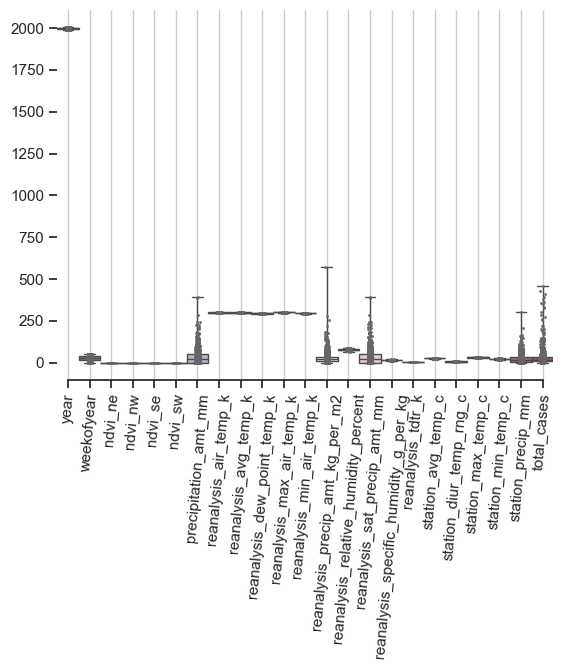

In [17]:
plot_box_strip(sj_train_features)

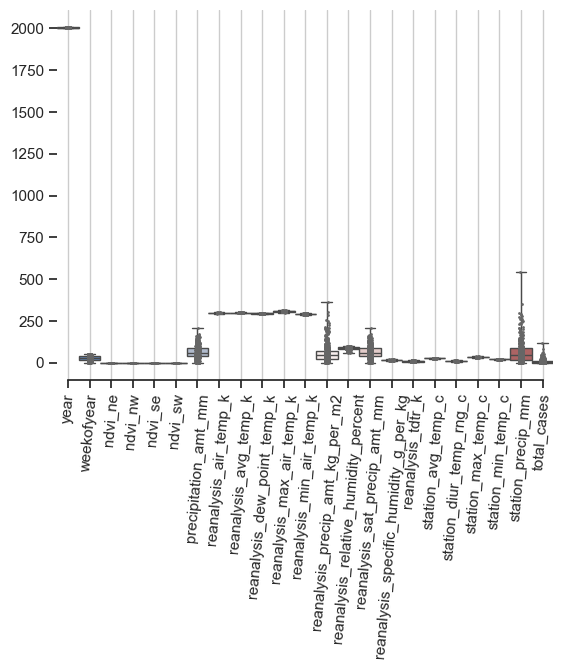

In [18]:
plot_box_strip(iq_train_features)

As can be seen from Figure 1, different types of features have different scales. 
Therefore, it is easier to see the data information by visualizing different types of features separately.

#### 1.5.1 Visualize Satellite vegetation data
- ndvi_ne – Pixel northeast of city centroid
- ndvi_nw – Pixel northwest of city centroid
- ndvi_se – Pixel southeast of city centroid
- ndvi_sw – Pixel southwest of city centroid

,ndvi_se,ndvi_sw,ndvi_ne,ndvi_nw
count,917.000000,917.000000,745.000000,887.000000
mean,0.177655,0.165956,0.057925,0.067469
std,0.057166,0.056073,0.107153,0.092479
min,-0.015533,-0.063457,-0.406250,-0.456100
25%,0.139283,0.129157,0.004500,0.016425
50%,0.177186,0.165971,0.057700,0.068075
75%,0.212557,0.202771,0.111100,0.115200
max,0.393129,0.381420,0.493400,0.437100


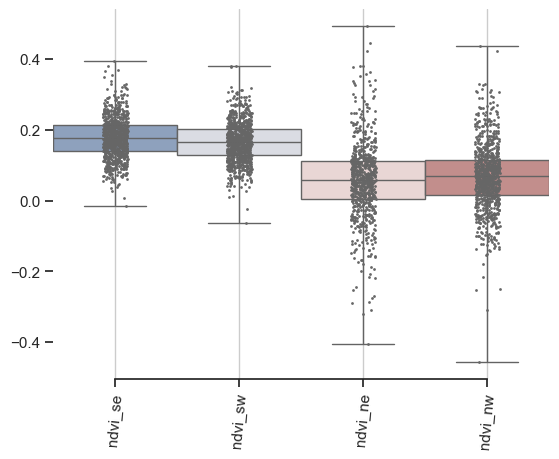

In [19]:
sj_train_features_satellite_veg = sj_train_features[['ndvi_se', 'ndvi_sw', 'ndvi_ne', 'ndvi_nw']]
plot_box_strip(sj_train_features_satellite_veg)
sj_train_features_satellite_veg.describe()

,ndvi_se,ndvi_sw,ndvi_ne,ndvi_nw
count,517.000000,517.000000,517.000000,517.000000
mean,0.250126,0.266779,0.263869,0.238783
std,0.077354,0.086345,0.081370,0.076751
min,0.029880,0.064183,0.061729,0.035860
25%,0.194743,0.204129,0.200000,0.179540
50%,0.249800,0.262143,0.263643,0.232971
75%,0.302300,0.325150,0.319971,0.293929
max,0.538314,0.546017,0.508357,0.454429


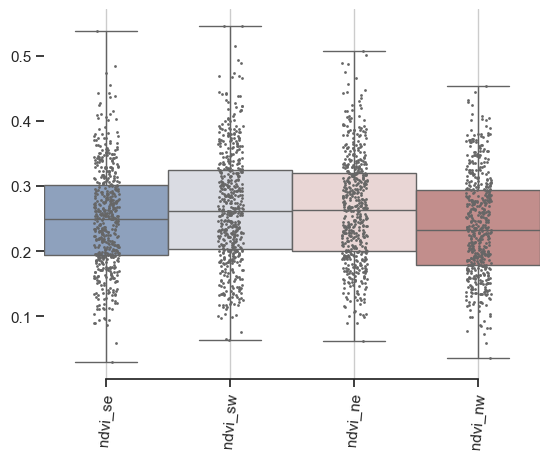

In [20]:
iq_train_features_satellite_veg = iq_train_features[['ndvi_se', 'ndvi_sw', 'ndvi_ne', 'ndvi_nw']]
plot_box_strip(iq_train_features_satellite_veg)
iq_train_features_satellite_veg.describe()

#### 1.5.2 Visualize reanalysis temptures data
- reanalysis_min_air_temp_k – Minimum air temperature
- reanalysis_max_air_temp_k – Maximum air temperature
- reanalysis_avg_temp_k – Average air temperature
- reanalysis_air_temp_k – Mean air temperature
- reanalysis_dew_point_temp_k – Mean dew point temperature

,reanalysis_min_air_temp_k,reanalysis_max_air_temp_k,reanalysis_avg_temp_k,reanalysis_air_temp_k,reanalysis_dew_point_temp_k
count,930.000000,930.000000,930.000000,930.000000,930.000000
mean,297.301828,301.398817,299.276920,299.163653,295.109519
std,1.294705,1.258927,1.218637,1.236429,1.569943
min,292.600000,297.800000,296.114286,295.938571,289.642857
25%,296.300000,300.400000,298.300000,298.195000,293.847857
50%,297.500000,301.500000,299.378571,299.254286,295.464286
75%,298.400000,302.400000,300.228571,300.132857,296.418929
max,299.900000,304.300000,302.164286,302.200000,297.795714


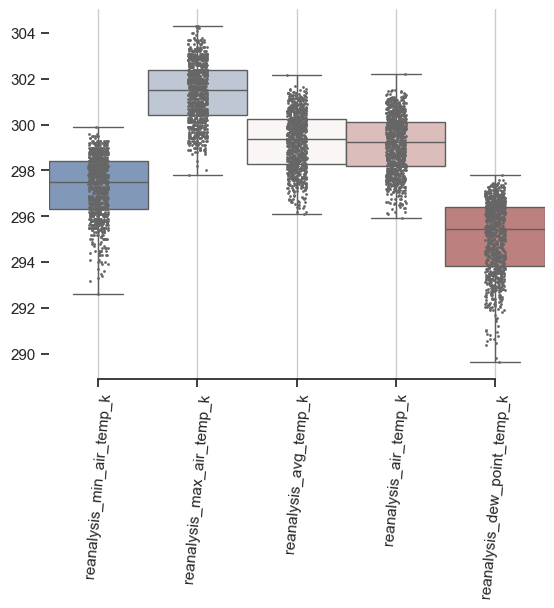

In [21]:
sj_train_features_reana_temp = sj_train_features[['reanalysis_min_air_temp_k', 
                                                  'reanalysis_max_air_temp_k', 
                                                  'reanalysis_avg_temp_k', 
                                                  'reanalysis_air_temp_k', 
                                                  'reanalysis_dew_point_temp_k']]
plot_box_strip(sj_train_features_reana_temp)
sj_train_features_reana_temp.describe()

,reanalysis_min_air_temp_k,reanalysis_max_air_temp_k,reanalysis_avg_temp_k,reanalysis_air_temp_k,reanalysis_dew_point_temp_k
count,516.000000,516.000000,516.000000,516.000000,516.000000
mean,292.866667,307.082752,299.133043,297.869538,295.492982
std,1.663069,2.382980,1.332073,1.170997,1.417229
min,286.900000,300.000000,294.892857,294.635714,290.088571
25%,291.975000,305.200000,298.221429,297.092500,294.593929
50%,293.050000,307.050000,299.121429,297.822857,295.852143
75%,294.200000,308.700000,300.123214,298.649286,296.548571
max,296.000000,314.000000,302.928571,301.637143,298.450000


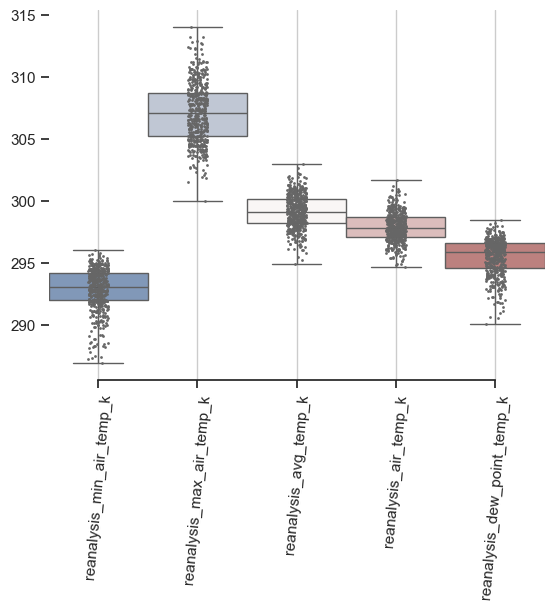

In [22]:
iq_train_features_reana_temp = iq_train_features[['reanalysis_min_air_temp_k', 
                                                  'reanalysis_max_air_temp_k', 
                                                  'reanalysis_avg_temp_k', 
                                                  'reanalysis_air_temp_k', 
                                                  'reanalysis_dew_point_temp_k']]
plot_box_strip(iq_train_features_reana_temp)
iq_train_features_reana_temp.describe()

#### 1.5.3 Visualize station temptures data
- station_min_temp_c – Minimum temperature
- station_max_temp_c – Maximum temperature
- station_avg_temp_c – Average temperature
- station_diur_temp_rng_c – Diurnal temperature range
- reanalysis_tdtr_k

,station_min_temp_c,station_max_temp_c,station_avg_temp_c,station_diur_temp_rng_c,reanalysis_tdtr_k
count,930.000000,930.000000,930.000000,930.000000,930.000000
mean,22.600645,31.607957,27.006528,6.757373,2.516267
std,1.506277,1.717297,1.415473,0.835993,0.498892
min,17.800000,26.700000,22.842857,4.528571,1.357143
25%,21.700000,30.600000,25.842857,6.200000,2.157143
50%,22.800000,31.700000,27.228571,6.757143,2.457143
75%,23.900000,32.800000,28.185714,7.285714,2.800000
max,25.600000,35.600000,30.071429,9.914286,4.428571


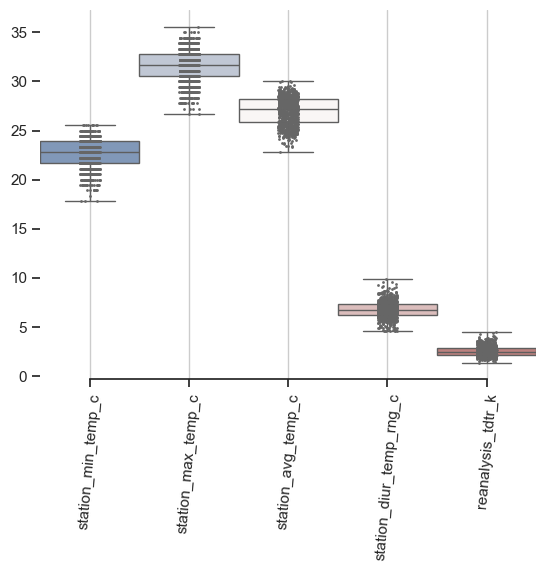

In [23]:
sj_train_features_sat_temp = sj_train_features[['station_min_temp_c', 
                                                  'station_max_temp_c', 
                                                  'station_avg_temp_c', 
                                                  'station_diur_temp_rng_c', 
                                                  'reanalysis_tdtr_k']]
plot_box_strip(sj_train_features_sat_temp)
sj_train_features_sat_temp.describe()

,station_min_temp_c,station_max_temp_c,station_avg_temp_c,station_diur_temp_rng_c,reanalysis_tdtr_k
count,512.000000,506.000000,483.000000,483.000000,516.000000
mean,21.196680,34.004545,27.530933,10.566197,9.206783
std,1.260327,1.325261,0.921769,1.535496,2.448525
min,14.700000,30.100000,21.400000,5.200000,3.714286
25%,20.600000,33.200000,27.000000,9.500000,7.371429
50%,21.300000,34.000000,27.600000,10.625000,8.964286
75%,22.000000,34.900000,28.100000,11.655000,11.014286
max,24.200000,42.200000,30.800000,15.800000,16.028571


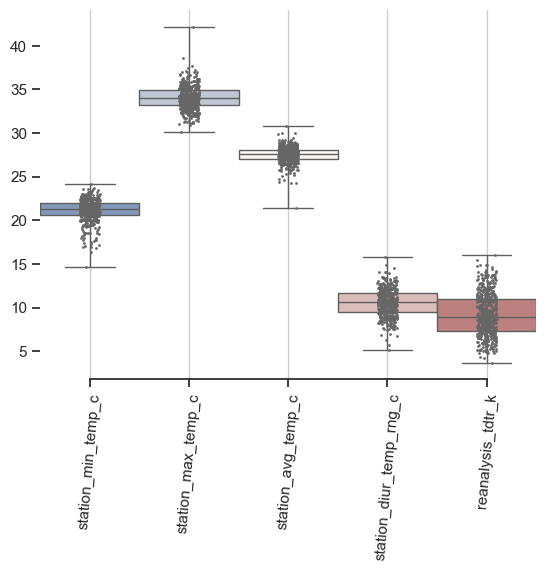

In [24]:
iq_train_features_sat_temp = iq_train_features[['station_min_temp_c', 
                                                  'station_max_temp_c', 
                                                  'station_avg_temp_c', 
                                                  'station_diur_temp_rng_c', 
                                                  'reanalysis_tdtr_k']]
plot_box_strip(iq_train_features_sat_temp)
iq_train_features_sat_temp.describe()

#### 1.5.4 Viusalize humidity data
- reanalysis_relative_humidity_percent – Mean relative humidity
- reanalysis_specific_humidity_g_per_kg – Mean specific humidity

,reanalysis_relative_humidity_percent,reanalysis_specific_humidity_g_per_kg
count,930.000000,930.000000
mean,78.568181,16.552409
std,3.389488,1.560923
min,66.735714,11.715714
25%,76.246071,15.236429
50%,78.667857,16.845714
75%,80.963214,17.858571
max,87.575714,19.440000


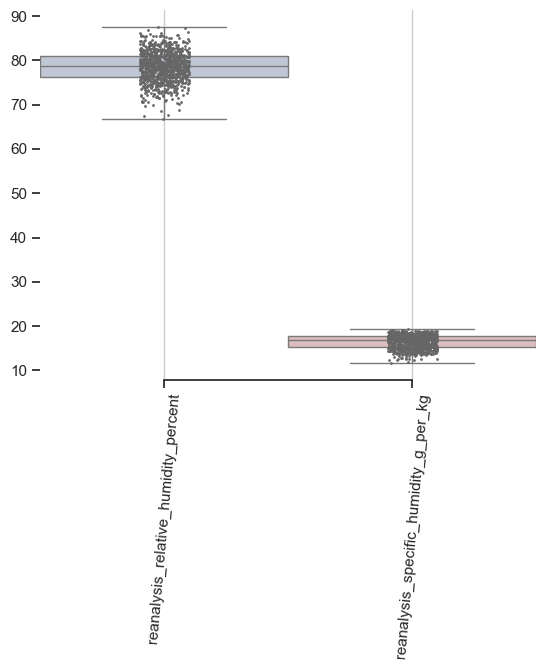

In [25]:
sj_train_features_humidity = sj_train_features[['reanalysis_relative_humidity_percent', 
                                                  'reanalysis_specific_humidity_g_per_kg']]
plot_box_strip(sj_train_features_humidity)
sj_train_features_humidity.describe()

,reanalysis_relative_humidity_percent,reanalysis_specific_humidity_g_per_kg
count,516.000000,516.000000
mean,88.639117,17.096110
std,7.583889,1.445769
min,57.787143,12.111429
25%,84.295000,16.102857
50%,90.917143,17.428571
75%,94.563929,18.180357
max,98.610000,20.461429


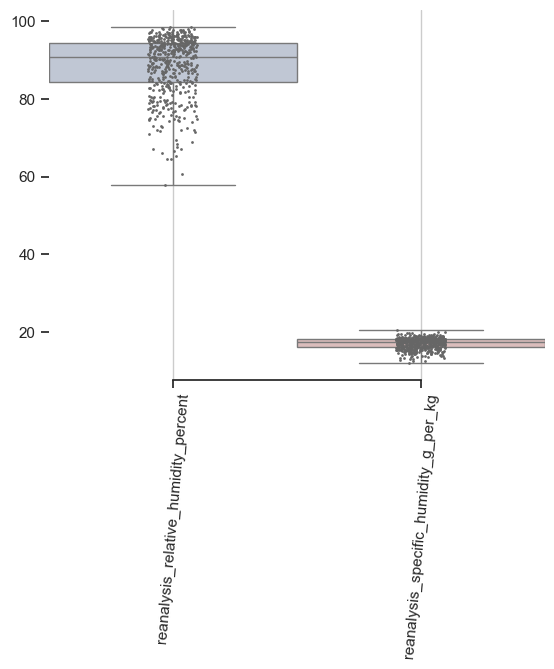

In [26]:
iq_train_features_humidity = iq_train_features[['reanalysis_relative_humidity_percent', 
                                                  'reanalysis_specific_humidity_g_per_kg']]
plot_box_strip(iq_train_features_humidity)
iq_train_features_humidity.describe()

#### 1.5.5 Visualize precipitation data
- precipitation_amt_mm: Total precipitation
- reanalysis_precip_amt_kg_per_m2: Total precipitation
- reanalysis_sat_precip_amt_mm: Total precipitation
- station_precip_mm: Total precipitation

,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,reanalysis_sat_precip_amt_mm,station_precip_mm
count,516.000000,516.000000,516.000000,504.000000
mean,64.245736,57.609864,64.245736,62.467262
std,35.218995,50.286555,35.218995,63.245958
min,0.000000,0.000000,0.000000,0.000000
25%,39.105000,24.065000,39.105000,17.200000
50%,60.470000,46.440000,60.470000,45.300000
75%,85.757500,71.072500,85.757500,85.950000
max,210.830000,362.030000,210.830000,543.300000


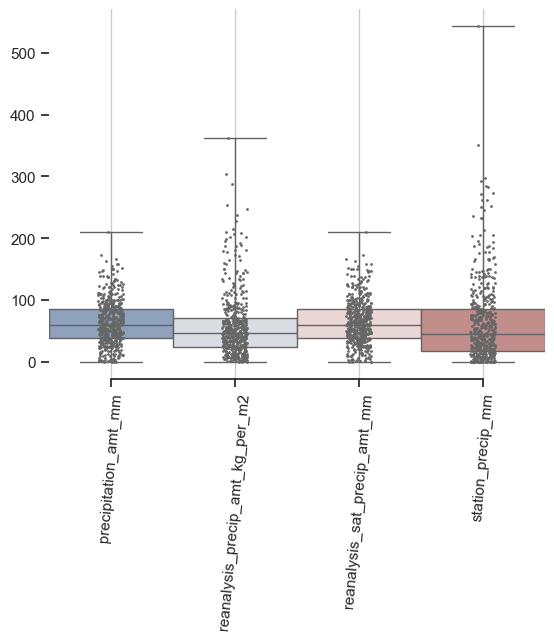

In [27]:
sj_train_features_precip = iq_train_features[['precipitation_amt_mm', 
                                                  'reanalysis_precip_amt_kg_per_m2', 
                                                  'reanalysis_sat_precip_amt_mm', 
                                                  'station_precip_mm']]
plot_box_strip(sj_train_features_precip)
sj_train_features_precip.describe()

,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,reanalysis_sat_precip_amt_mm,station_precip_mm
count,516.000000,516.000000,516.000000,504.000000
mean,64.245736,57.609864,64.245736,62.467262
std,35.218995,50.286555,35.218995,63.245958
min,0.000000,0.000000,0.000000,0.000000
25%,39.105000,24.065000,39.105000,17.200000
50%,60.470000,46.440000,60.470000,45.300000
75%,85.757500,71.072500,85.757500,85.950000
max,210.830000,362.030000,210.830000,543.300000


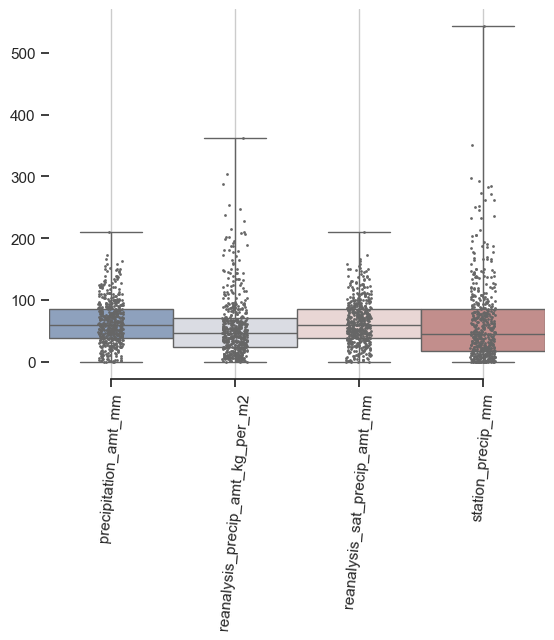

In [28]:
iq_train_features_precip = iq_train_features[['precipitation_amt_mm', 
                                                  'reanalysis_precip_amt_kg_per_m2', 
                                                  'reanalysis_sat_precip_amt_mm', 
                                                  'station_precip_mm']]
plot_box_strip(iq_train_features_precip)
iq_train_features_precip.describe()

From precipitation distribution, it seems there are some outliers, but it is possible that precipitation value is very high in specific situabtion.
So let’s not process these seemingly abnormal data now.

# This part was created by Jing Jiang

## Step 2: Data processing

### 2.1 Check and deal with week feature

In [29]:
import numpy as np

In [30]:
# To check whether there is wrong week value
# Print Min, Max week, number of week values
def check_week_value(dataset, week_feature_name):
    for year in dataset.year.unique():
        print(
            f'{year} max: {max(dataset[dataset.year==year][week_feature_name])}\
            first: {dataset[dataset.year==year][week_feature_name].iloc[0]}\
            min: {min(dataset[dataset.year==year][week_feature_name])}\
            first week_start_date: {dataset[dataset.year==year]["week_start_date"].iloc[0]}\
            uniques: {dataset[dataset.year==year][week_feature_name].nunique()}')

In [31]:
check_week_value(sj_train_features, "weekofyear")

1990 max: 52            first: 18            min: 18            first week_start_date: 1990-04-30            uniques: 35
1991 max: 52            first: 1            min: 1            first week_start_date: 1991-01-01            uniques: 52
1992 max: 52            first: 1            min: 1            first week_start_date: 1992-01-01            uniques: 52
1993 max: 53            first: 53            min: 1            first week_start_date: 1993-01-01            uniques: 52
1994 max: 52            first: 52            min: 1            first week_start_date: 1994-01-01            uniques: 52
1995 max: 52            first: 52            min: 1            first week_start_date: 1995-01-01            uniques: 52
1996 max: 52            first: 1            min: 1            first week_start_date: 1996-01-01            uniques: 52
1997 max: 52            first: 1            min: 1            first week_start_date: 1997-01-01            uniques: 52
1998 max: 52            first: 1           

In [32]:
check_week_value(iq_train_features, "weekofyear")

2000 max: 51            first: 26            min: 26            first week_start_date: 2000-07-01            uniques: 26
2001 max: 52            first: 1            min: 1            first week_start_date: 2001-01-01            uniques: 52
2002 max: 52            first: 1            min: 1            first week_start_date: 2002-01-01            uniques: 52
2003 max: 52            first: 1            min: 1            first week_start_date: 2003-01-01            uniques: 52
2004 max: 52            first: 1            min: 1            first week_start_date: 2004-01-01            uniques: 52
2005 max: 53            first: 53            min: 1            first week_start_date: 2005-01-01            uniques: 52
2006 max: 52            first: 52            min: 1            first week_start_date: 2006-01-01            uniques: 52
2007 max: 52            first: 1            min: 1            first week_start_date: 2007-01-01            uniques: 52
2008 max: 52            first: 1            

There are some mistaken week number
- In Sj dataset, like year 1993, the first week is 53
- In Iq dataset, like year 2005, 2006, the first week is 53, 52 respectively

So let's deal with those wrong week values

In [33]:
# List all years which have wrong week value
sj_year_list = [1993, 1994, 1995, 1999, 2000, 2005, 2006]
iq_year_list = [1993, 1994, 1995, 1999, 2000, 2005, 2006]

# All week values in problem year are added one
for year in sj_year_list:
    sj_train_features.loc[:,'weekofyear'] = np.where(sj_train_features.year==year, sj_train_features.weekofyear+1, 
                                                     sj_train_features.weekofyear)
for year in iq_year_list:
    iq_train_features.loc[:,'weekofyear'] = np.where(iq_train_features.year==year, iq_train_features.weekofyear+1, 
                                                     iq_train_features.weekofyear)
    
# Reduce any week values over 52 down to 1    
sj_train_features.loc[:,'weekofyear'] = np.where(sj_train_features.weekofyear > 52, 1, sj_train_features.weekofyear)
iq_train_features.loc[:,'weekofyear'] = np.where(iq_train_features.weekofyear > 52, 1, iq_train_features.weekofyear)

In [34]:
# Check results
check_week_value(sj_train_features, "weekofyear")

1990 max: 52            first: 18            min: 18            first week_start_date: 1990-04-30            uniques: 35
1991 max: 52            first: 1            min: 1            first week_start_date: 1991-01-01            uniques: 52
1992 max: 52            first: 1            min: 1            first week_start_date: 1992-01-01            uniques: 52
1993 max: 52            first: 1            min: 1            first week_start_date: 1993-01-01            uniques: 52
1994 max: 52            first: 1            min: 1            first week_start_date: 1994-01-01            uniques: 52
1995 max: 52            first: 1            min: 1            first week_start_date: 1995-01-01            uniques: 52
1996 max: 52            first: 1            min: 1            first week_start_date: 1996-01-01            uniques: 52
1997 max: 52            first: 1            min: 1            first week_start_date: 1997-01-01            uniques: 52
1998 max: 52            first: 1            mi

In [35]:
check_week_value(iq_train_features, "weekofyear")

2000 max: 52            first: 27            min: 27            first week_start_date: 2000-07-01            uniques: 26
2001 max: 52            first: 1            min: 1            first week_start_date: 2001-01-01            uniques: 52
2002 max: 52            first: 1            min: 1            first week_start_date: 2002-01-01            uniques: 52
2003 max: 52            first: 1            min: 1            first week_start_date: 2003-01-01            uniques: 52
2004 max: 52            first: 1            min: 1            first week_start_date: 2004-01-01            uniques: 52
2005 max: 52            first: 1            min: 1            first week_start_date: 2005-01-01            uniques: 52
2006 max: 52            first: 1            min: 1            first week_start_date: 2006-01-01            uniques: 52
2007 max: 52            first: 1            min: 1            first week_start_date: 2007-01-01            uniques: 52
2008 max: 52            first: 1            mi

### 2.2 Dealing with missing data
Using forward fill method

In [36]:
# Print missing data
print(sj_train_features[sj_train_features.isna().any(axis=1)].shape)

(209, 25)


In [37]:
print(iq_train_features[iq_train_features.isna().any(axis=1)].shape)

(48, 25)


In [38]:
# Fill missing data with mean
# ppd.imputate_data_mean(sj_train_features, 4) 
# Use forward fill to deal with missing data
sj_train_features = sj_train_features.fillna(sj_train_features.ffill())

In [39]:

iq_train_features = iq_train_features.fillna(iq_train_features.ffill())

In [40]:
# Check results
print(sj_train_features[sj_train_features.isna().any(axis=1)].shape)

(0, 25)


In [41]:
print(iq_train_features[iq_train_features.isna().any(axis=1)].shape)

(0, 25)


### 2.3 Normalisation

#### MinMaxScaler

In [42]:
from sklearn.preprocessing import MinMaxScaler

def get_features_name(dataset, exlude_top_number):
    """
    Get the list of feature names excluding the top N features.

    Parameters:
    dataset: The input dataset from which feature names are to be extracted.
    exclude_top_number (int): The number of top features to exclude from the dataset.

    Returns:
    list: A list of remaining feature names after excluding the top N features.
    """
    all_features = list(dataset.columns)
    top_features_to_exclude = all_features[:exlude_top_number]
    remaining_features = [feature for feature in all_features if feature not in top_features_to_exclude]

    return remaining_features

def normalize_minmaxscaler(dataset, features_to_normalize):
    """
    Normalize specified features in the dataset using Min-Max scaling.

    Parameters:
    dataset: The input dataset containing the features to be normalized.
    features_to_normalize: A list of feature names to be normalized.

    Returns:
    pd.DataFrame: The dataset with the specified features normalized.
    """
    scaler = MinMaxScaler()
    df_scaled = dataset[features_to_normalize].copy() 
    df_scaled = scaler.fit_transform(df_scaled)
    dataset[features_to_normalize] = df_scaled 
    
    return dataset

In [43]:
# Get features name which need to be normalized
sj_normalize_features = get_features_name(sj_train_features, 4)
# Using MinMaxScale to normalize dataset
sj_train_features_scaled = normalize_minmaxscaler(sj_train_features, sj_normalize_features)
sj_train_features_scaled.to_csv('../data/processed/sj_scaled_data.csv')

In [44]:
# Get features name which need to be normalized
iq_normalize_features = get_features_name(iq_train_features, 4)
# Using MinMaxScale to normalize dataset
iq_train_features_scaled = normalize_minmaxscaler(iq_train_features, iq_normalize_features)
iq_train_features_scaled.to_csv('../data/processed/iq_scaled_data.csv')

## Step 3:  Exploratory Data Analysis (EDA)

### 3.1 Time-series analysis
Visualise time-series trends for features over time

In [45]:
# Convert 'week_start_date' to datetime
sj_train_features_scaled['week_start_date'] = pd.to_datetime(sj_train_features_scaled['week_start_date'])
iq_train_features_scaled['week_start_date'] = pd.to_datetime(iq_train_features_scaled['week_start_date'])

In [46]:
# Set it as the index for time series analysis
sj_train_features_scaled_ts = sj_train_features_scaled.set_index('week_start_date', inplace=False)
iq_train_features_scaled_ts = iq_train_features_scaled.set_index('week_start_date', inplace=False)

In [47]:
def plot_time_series(dataset, features, city):
    """
    Plot time-series data for specified features of a dataset for a given city.

    Parameters:
    dataset: The input dataset containing the time-series data.
    features: A list of feature names to be plotted.
    city (str): The name of the city for which the time-series analysis is being done.
    """
    fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(10, 30), sharex=True)
    fig.suptitle(f'Time-Series Analysis of {city}')

    for i, feature in enumerate(features):
        dataset[feature].plot(ax=axes[i], title=feature)
        axes[i].set_ylabel(feature)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

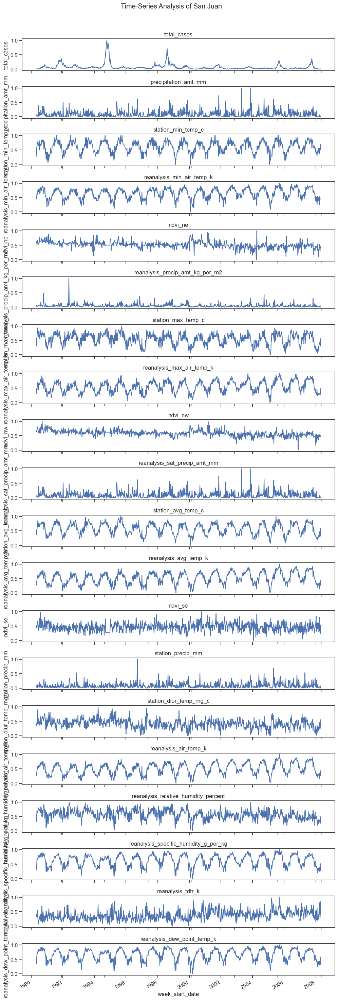

In [48]:
# Plot time series for selected features
selected_features = [
    'total_cases', 'precipitation_amt_mm', 'station_min_temp_c', 'reanalysis_min_air_temp_k', 
    'ndvi_ne', 'reanalysis_precip_amt_kg_per_m2', 'station_max_temp_c', 'reanalysis_max_air_temp_k',
    'ndvi_nw', 'reanalysis_sat_precip_amt_mm', 'station_avg_temp_c', 'reanalysis_avg_temp_k', 
    'ndvi_se',  'station_precip_mm', 'station_diur_temp_rng_c', 'reanalysis_air_temp_k', 
    'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'reanalysis_dew_point_temp_k'
]

plot_time_series(sj_train_features_scaled_ts, selected_features, 'San Juan')

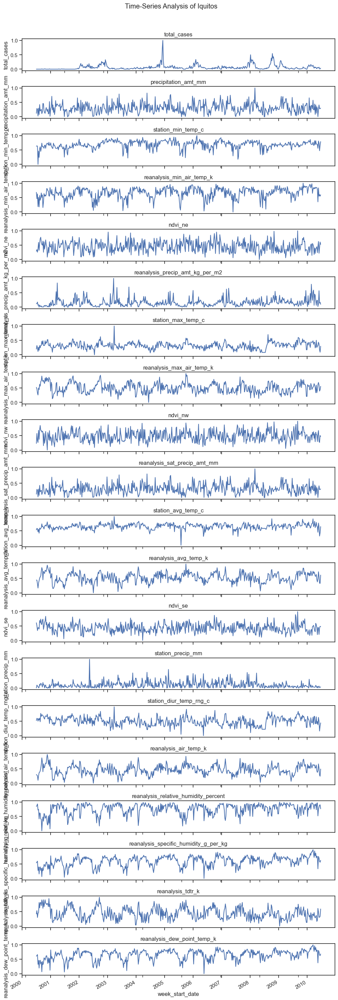

In [49]:
plot_time_series(iq_train_features_scaled_ts, selected_features, 'Iquitos')

### 3.2 Seasonality Analysis

In [50]:
import matplotlib.pyplot as plt

def plot_seasonality(dataset, features, city):
    """
    Plot the seasonality of specified features in a dataset for a given city.

    Parameters:
    dataset: The input dataset containing the time-series data.
    features (list): A list of feature names to be plotted.
    city (str): The name of the city for which the seasonality analysis is being done.

    """
    # Create subplots with a 7x3 layout
    fig, axs = plt.subplots(7, 3, figsize=(20, 23))
    axs = axs.flatten()

    # List of years to iterate over and color mapping
    years = dataset['year'].unique()
    colors = [plt.get_cmap('viridis')(i / (len(years) - 1)) for i in range(len(years))]

    # Plot each feature
    for idx, feature in enumerate(features):
        ax = axs[idx]
        
        for i, year in enumerate(years):
            year_data = dataset[dataset['year'] == year]
            ax.plot(year_data['weekofyear'], year_data[feature], color=colors[i], label=year)
        
        # Label the subplot
        ax.set_ylabel(feature.replace('_', ' ').title(), size=12)
        ax.set_xlabel('Week of the Year', size=12)
        ax.set_title(f'{feature.replace("_", " ").title()} Seasonality Analysis', size=10)
        ax.legend(loc=2, framealpha=1, ncol=3, prop={'size': 6}, labelcolor='black')
        ax.set_xticks([12, 24, 36, 48, 52])
        ax.grid(True)

    # Hide unused subplots if there are fewer than 21 features
    for ax in axs[len(features):]:
        ax.axis('off')

    # Add main title
    fig.suptitle(f'Features Seasonal Analysis of {city}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


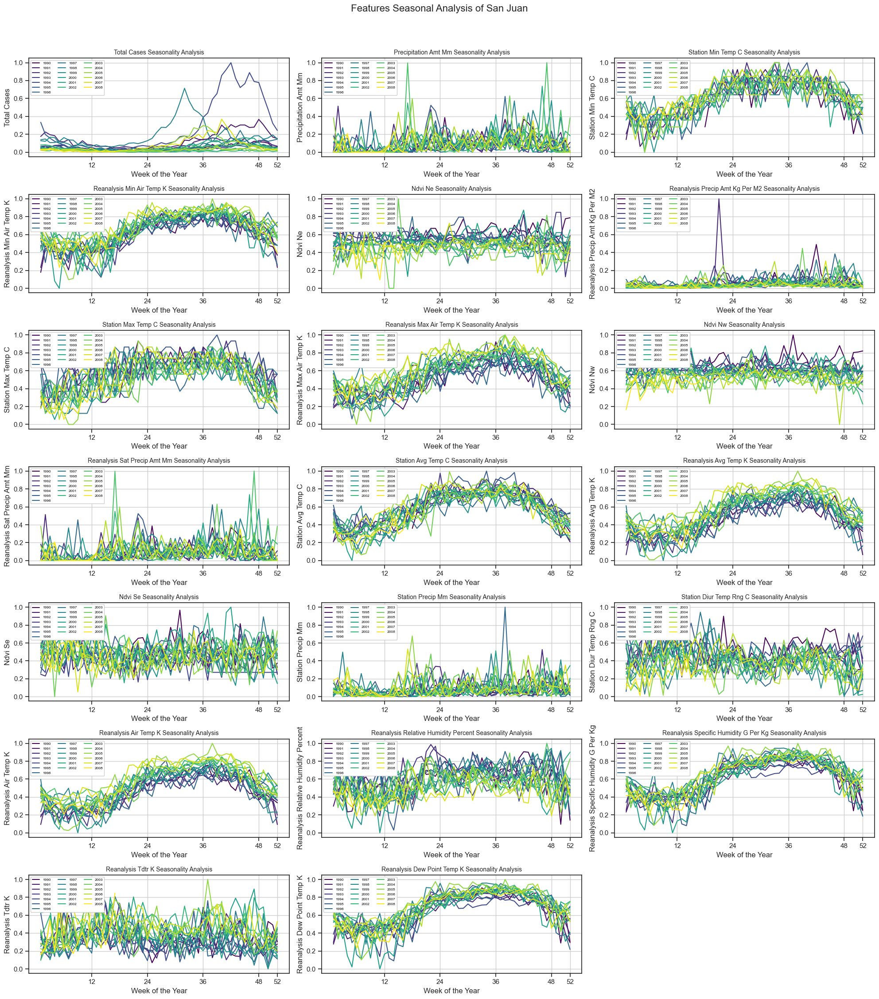

In [51]:
selected_features_seasonality = [
    'total_cases', 'precipitation_amt_mm', 'station_min_temp_c', 'reanalysis_min_air_temp_k', 
    'ndvi_ne', 'reanalysis_precip_amt_kg_per_m2', 'station_max_temp_c', 'reanalysis_max_air_temp_k',
    'ndvi_nw', 'reanalysis_sat_precip_amt_mm', 'station_avg_temp_c', 'reanalysis_avg_temp_k', 
    'ndvi_se',  'station_precip_mm', 'station_diur_temp_rng_c', 'reanalysis_air_temp_k', 
    'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'reanalysis_dew_point_temp_k'
]

plot_seasonality(sj_train_features_scaled, selected_features_seasonality, "San Juan")

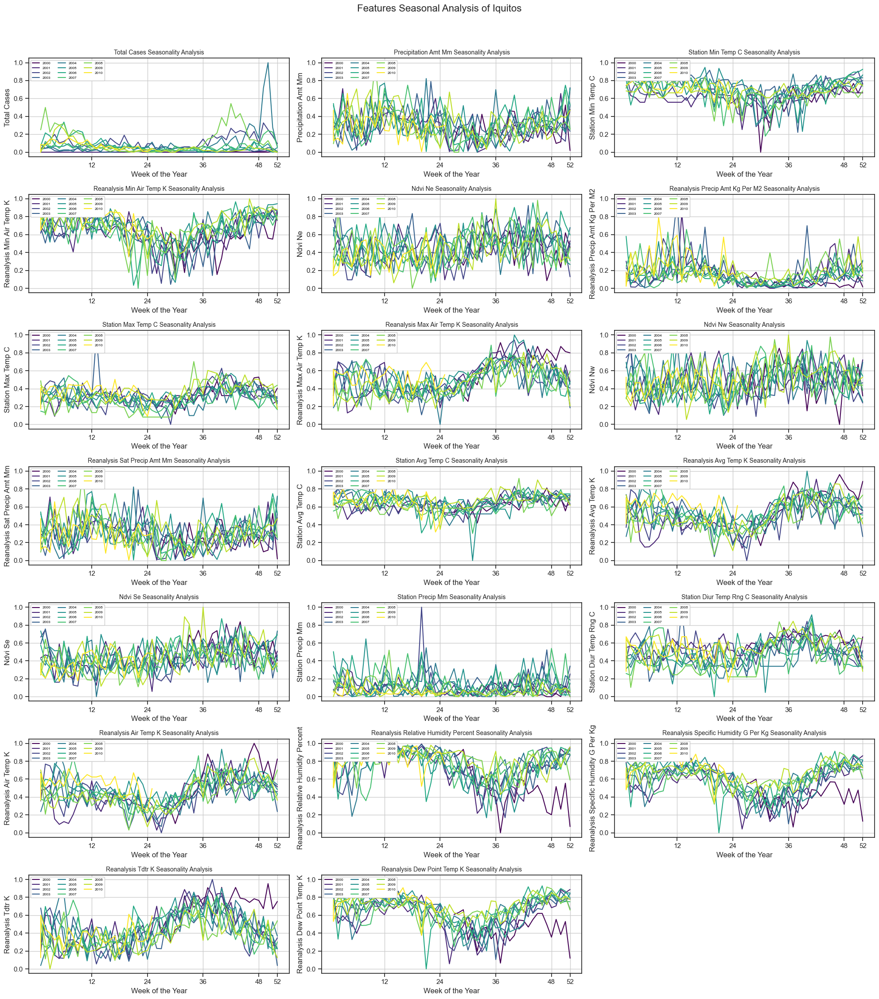

In [52]:
plot_seasonality(iq_train_features_scaled, selected_features_seasonality, "Iquitos")

# This part was create by Weiyi Sun

### 3.3 Violin Plot

In [53]:
# Define violin plot function
def generate_violin_plot(dataset, city):
    plt.figure(figsize=(9, 5))
    # Exclude the first four columns
    new_data = dataset.drop(dataset.columns[[0, 1, 2, 3]], axis=1)
    
    sns.violinplot(data=new_data, inner='box', width=1, fill=True)
    plt.xticks(rotation=75)
    plt.title(f'Violin Plot of Normalised Features {city}')
    plt.show()

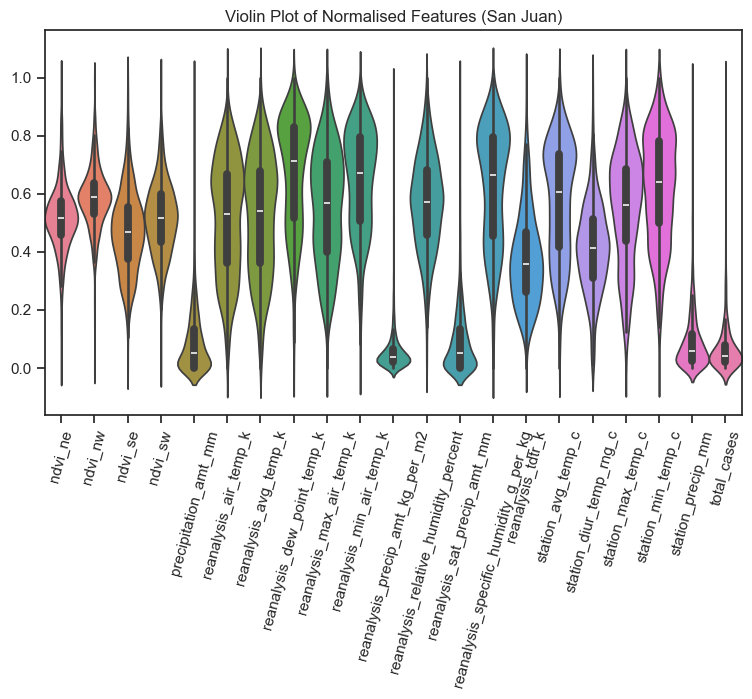

In [54]:
generate_violin_plot(sj_train_features_scaled, '(San Juan)')

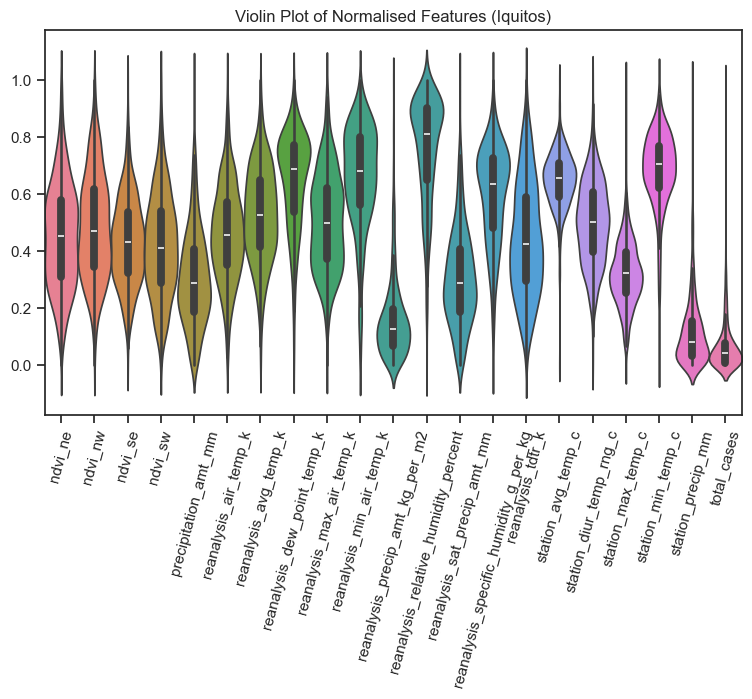

In [55]:
generate_violin_plot(iq_train_features_scaled, '(Iquitos)')

### 3.4 Seasonal Decompose Analysis

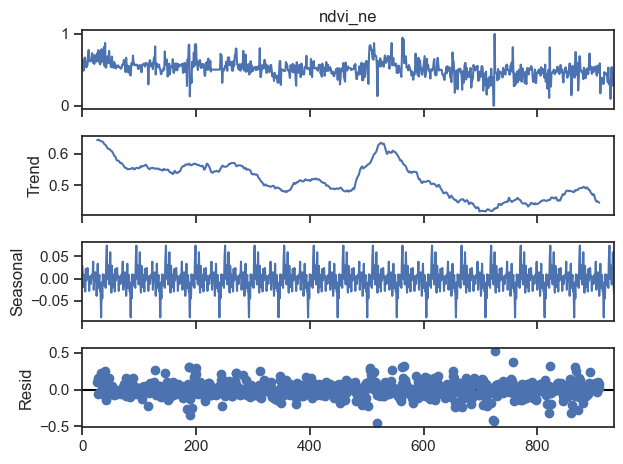

In [56]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Choose specific feature to do seasonal decompose analysis
period =  52 
results = seasonal_decompose(sj_train_features_scaled['ndvi_ne'], period=period)
results.plot()
plt.show()

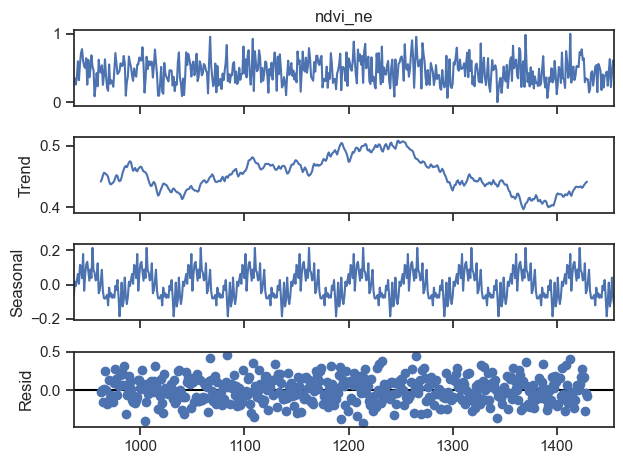

In [57]:
period =  52 
results = seasonal_decompose(iq_train_features_scaled['ndvi_ne'], period=period)
results.plot()
plt.show()

### 3.5 Correlation Coefficients
Pearson coefficient

In [58]:
# sj_train_features_scaled.drop(['city', 'year', 'weekofyear', 'week_start_date'], axis=1, inplace=True)

In [59]:
# iq_train_features_scaled.drop(['city', 'year', 'weekofyear', 'week_start_date'], axis=1, inplace=True)

In [60]:
# sj_features_pearson_plot 
sj_features = sj_train_features_scaled.drop(
    ["total_cases", 'city', 'year', 'weekofyear', 'week_start_date'], axis=1)  
sj_target = sj_train_labels["total_cases"]

In [61]:
# iq_features_pearson_plot 
iq_features = iq_train_features_scaled.drop(
    ["total_cases", 'city', 'year', 'weekofyear', 'week_start_date'], axis=1)
iq_target = iq_train_labels["total_cases"]

In [62]:
def plot_pearson_fig(features, city):
    # Compute the correlation matrix to observe the correlations between pairs of features. 
    corrMatt = features.corr()

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corrMatt)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(18, 18))
    plt.title(f'Correlations between pairs of features {city}')

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(200, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(
        corrMatt, 
        vmax=1, 
        #vmin=-1,
        square=False, 
        cmap=cmap, 
        mask=mask,
        ax=ax, 
        annot=True, 
        fmt='.2g', 
        linewidths=1);

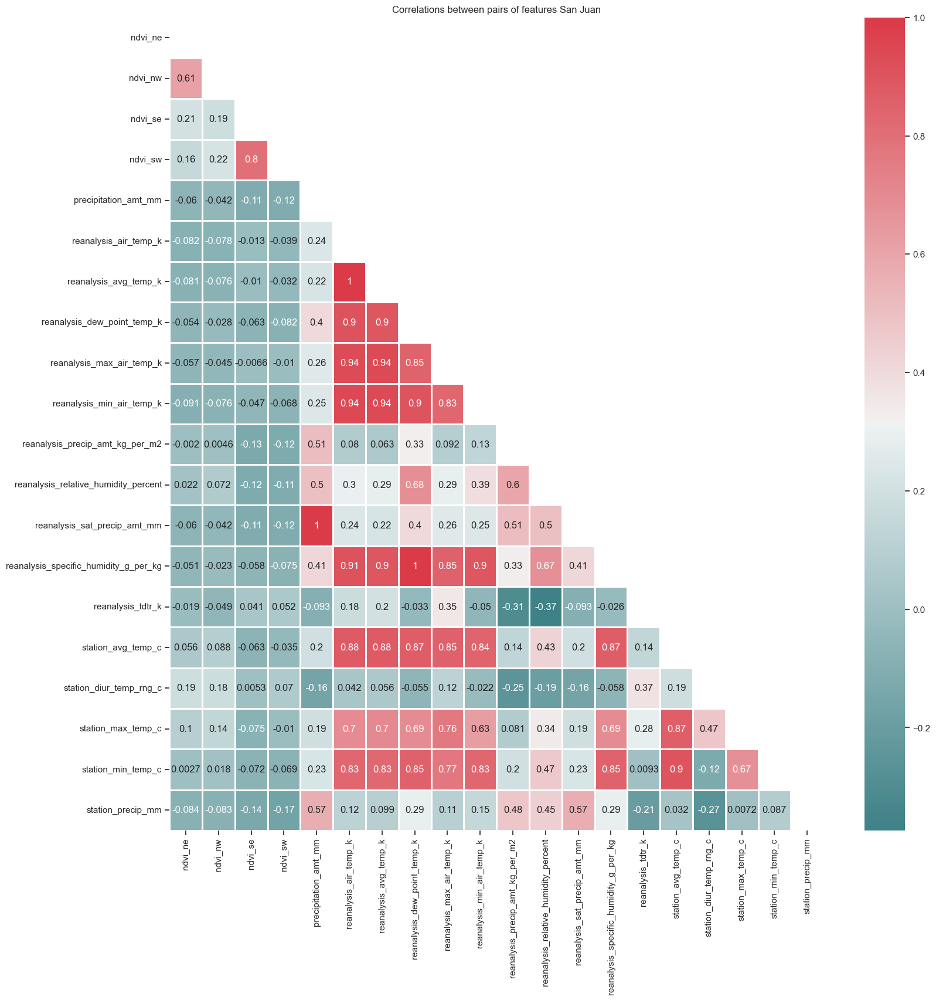

In [63]:
plot_pearson_fig(sj_features, 'San Juan')

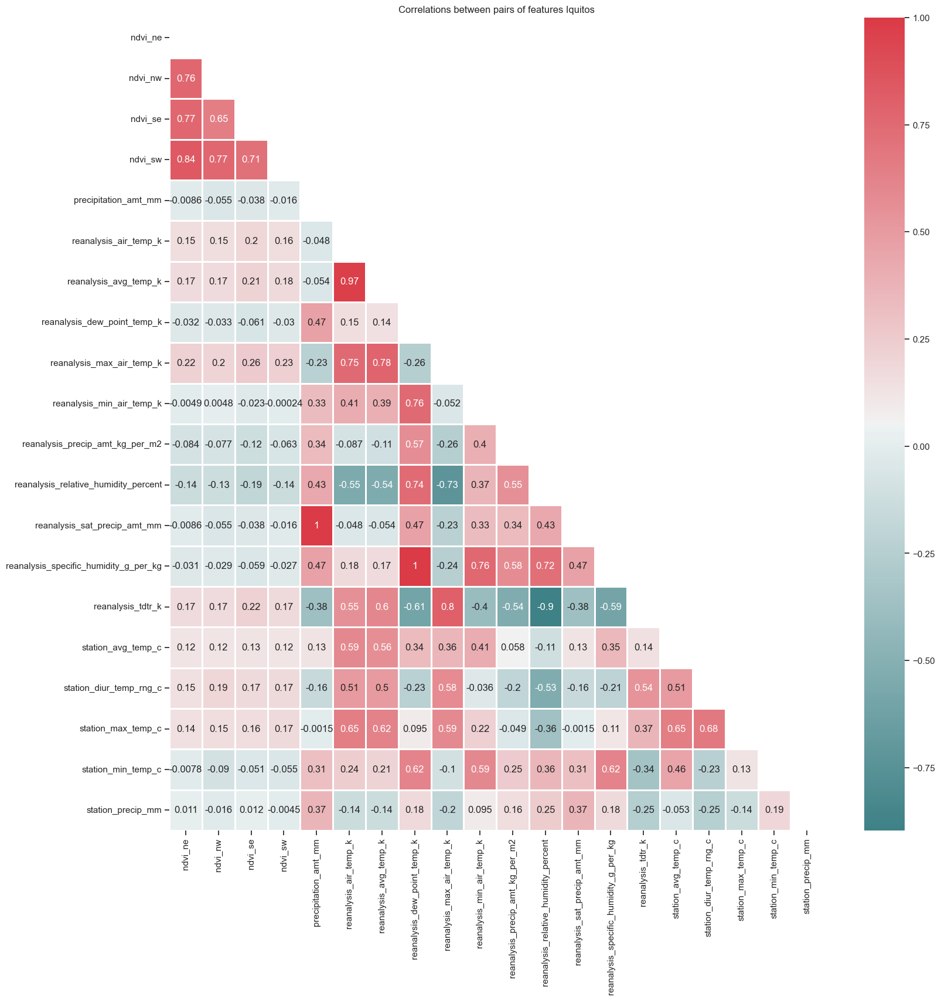

In [64]:
plot_pearson_fig(iq_features, 'Iquitos')

# This part was created by Weiyi Sun

## Step 4: Feature Selection

### 4.1 Pearson coefficient feature selection

In [65]:
# Define function to generate pearson features
def generate_pearson_feature(feature, threshold):
    corrMatt = feature.corr()
    # Get lower triangular part of the matrix
    lower_triangle = np.tril(corrMatt)
    lower_triangle = pd.DataFrame(lower_triangle)
    # Re-add feature names to new matrix
    feature_names = feature.columns
    lower_triangle.columns = feature_names
    lower_triangle.index = pd.Index(feature_names)
    
    """ Find the pairs of features where the absolute value of correlation is less than threshold 
    (since we only compare the corr value between features, 
    if there is high corr that means those two features are high related, only need to chose one of them) """
    # Use a mask to identify positions that fulfill the condition
    mask = abs(lower_triangle) < threshold
    # Apply the mask to the correlation matrix
    filtered_corr_matrix = lower_triangle.where(mask)
    # keep column features name where the number of NaN vaule is less than 2
    pearson_features_to_keep = filtered_corr_matrix.columns[filtered_corr_matrix.isnull().sum() < 2]
    pearson_features = feature[pearson_features_to_keep]

    return pearson_features

In [66]:
sj_pearson_features = generate_pearson_feature(sj_features, 0.9)
sj_pearson_features

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,0.587840,0.626763,0.523701,0.541889,0.307692,0.452055,0.056091,0.318138,0.031797,0.297392,0.413953,0.359684,0.440318,0.303371,0.282051,0.052305
1,0.640416,0.669811,0.435300,0.492142,0.476923,0.520548,0.031446,0.510214,0.058423,0.473460,0.330233,0.535573,0.342175,0.561798,0.564103,0.028114
2,0.487412,0.704284,0.422680,0.526662,0.415385,0.643836,0.045749,0.734988,0.088428,0.664509,0.306977,0.535573,0.363395,0.617978,0.641026,0.135338
3,0.594546,0.785005,0.594845,0.672866,0.553846,0.602740,0.024365,0.652660,0.039324,0.641761,0.348837,0.640316,0.416446,0.741573,0.705128,0.013076
4,0.669649,0.804187,0.652699,0.698613,0.630769,0.671233,0.021385,0.658555,0.019252,0.711300,0.539535,0.843874,0.899204,0.932584,0.782051,0.018960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,0.538098,0.465965,0.797737,0.808538,0.292308,0.246575,0.013234,0.360433,0.069611,0.249676,0.497674,0.304348,0.233422,0.370787,0.423077,0.005884
932,0.409326,0.491790,0.330113,0.291862,0.307692,0.534247,0.006433,0.377365,0.009780,0.381542,0.441860,0.470356,0.424403,0.438202,0.564103,0.001635
933,0.279053,0.451579,0.375103,0.460063,0.246154,0.438356,0.061350,0.397861,0.043420,0.319586,0.269767,0.298419,0.220159,0.303371,0.500000,0.100360
934,0.453565,0.451579,0.536956,0.614327,0.292308,0.452055,0.008449,0.266315,0.000000,0.277418,0.465116,0.341897,0.318302,0.303371,0.500000,0.036613


In [67]:
iq_pearson_features = generate_pearson_feature(iq_features, 0.9)
iq_pearson_features

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,reanalysis_avg_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
936,0.293660,0.230302,0.611693,0.379834,0.442667,0.521429,0.681319,0.119300,0.848334,0.120524,0.543713,0.423434,0.531915,0.525943,0.198347,0.631579,0.005522
937,0.347279,0.573956,0.510542,0.368330,0.440000,0.471429,0.461538,0.127061,0.876820,0.287483,0.569033,0.535963,0.585106,0.600629,0.322314,0.642105,0.102338
938,0.257549,0.327948,0.342688,0.132475,0.311111,0.321429,0.626374,0.178908,0.932356,0.263340,0.599829,0.298144,0.574468,0.591195,0.239669,0.631579,0.070127
939,0.371674,0.261770,0.441198,0.282527,0.166222,0.257143,0.186813,0.066182,0.721340,0.026562,0.277844,0.438515,0.464539,0.503145,0.115702,0.000000,0.055218
940,0.597620,0.683923,0.441535,0.616104,0.341333,0.500000,0.505495,0.087838,0.744051,0.297681,0.399145,0.469838,0.553191,0.592453,0.264463,0.463158,0.007362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0.629206,0.676209,0.445412,0.473880,0.731556,0.692857,0.835165,0.124299,0.758854,0.262297,0.763388,0.494200,0.769504,0.635220,0.438017,0.810526,0.049696
1452,0.220381,0.297470,0.208804,0.335124,0.560000,0.607143,0.549451,0.572052,0.828282,0.410141,0.713601,0.305104,0.641844,0.500000,0.380165,0.736842,0.067366
1453,0.414950,0.263271,0.433639,0.351846,0.336000,0.392857,0.604396,0.139767,0.893932,0.279562,0.586484,0.307425,0.319149,0.160377,0.173554,0.473684,0.013620
1454,0.609423,0.501498,0.489750,0.542309,0.327111,0.435714,0.549451,0.172168,0.903240,0.283024,0.563388,0.337587,0.429078,0.333333,0.090909,0.663158,0.029450


# This part was created by Jing Jiang

### 4.2 Filter Method

In [68]:
from sklearn.feature_selection import SelectKBest, chi2, f_regression
def filter_method(feature, target, topvalue):
    """
    Select the top features based on a statistical test and return the transformed features.

    Parameters:
    feature: The input features from which to select the top features.
    target : The target variable used for calculating the statistical test.
    topvalue (int): The number of top features to select.

    Returns:
    pd.DataFrame: A DataFrame containing the top selected features.
    """
    
    # Select top x features
    selector = SelectKBest(f_regression, k=topvalue)
    fiter_features = selector.fit_transform(feature, target)  # Transformed features

    fiter_features = pd.DataFrame(fiter_features)
    return fiter_features

In [69]:
sj_fm_features = filter_method(sj_features, sj_target, 5)
sj_fm_features

,0,1,2,3,4
0,0.339933,0.307692,0.297392,0.359684,0.303371
1,0.528474,0.476923,0.473460,0.535573,0.561798
2,0.710356,0.415385,0.664509,0.535573,0.617978
3,0.695111,0.553846,0.641761,0.640316,0.741573
4,0.757841,0.630769,0.711300,0.843874,0.932584
...,...,...,...,...,...
931,0.300859,0.292308,0.249676,0.304348,0.370787
932,0.440687,0.307692,0.381542,0.470356,0.438202
933,0.379008,0.246154,0.319586,0.298419,0.303371
934,0.322762,0.292308,0.277418,0.341897,0.303371


In [70]:
iq_fm_features = filter_method(iq_features, iq_target, 5)
iq_fm_features

,0,1,2,3,4
0,0.609431,0.681319,0.543713,0.423434,0.631579
1,0.630275,0.461538,0.569033,0.535963,0.642105
2,0.661883,0.626374,0.599829,0.298144,0.631579
3,0.323936,0.186813,0.277844,0.438515,0.000000
4,0.462669,0.505495,0.399145,0.469838,0.463158
...,...,...,...,...,...
515,0.805741,0.835165,0.763388,0.494200,0.810526
516,0.761148,0.549451,0.713601,0.305104,0.736842
517,0.647360,0.604396,0.586484,0.307425,0.473684
518,0.626175,0.549451,0.563388,0.337587,0.663158


### 4.3 Wrapper Methods - Recursive Feature Elimination (RFE)

In [71]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
def rfe_method(feature, target, topValue): 
    """
    Perform Recursive Feature Elimination (RFE) to select the top features based on a linear regression model.

    Parameters:
    feature : The input features from which to select the top features.
    target : The target variable used for training the model.
    topValue (int): The number of top features to select.

    Returns:
    pd.DataFrame: A DataFrame containing the top selected features.
    """
    
    # Create a linear regression model
    model = LinearRegression()
    # RFE with top x features remaining
    selector = RFE(model, n_features_to_select=topValue)
    selector.fit(feature, target)
    rfe_features = selector.transform(feature)  # Transformed features
    rfe_features = pd.DataFrame(rfe_features)
    return rfe_features

In [72]:
sj_rfe_features = rfe_method(sj_features, sj_target, 18)
sj_rfe_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.626763,0.523701,0.541889,0.031797,0.261008,0.269185,0.339933,0.307692,0.452055,0.056091,0.318138,0.031797,0.297392,0.413953,0.359684,0.440318,0.303371,0.282051
1,0.669811,0.435300,0.492142,0.058423,0.362993,0.384888,0.528474,0.476923,0.520548,0.031446,0.510214,0.058423,0.473460,0.330233,0.535573,0.342175,0.561798,0.564103
2,0.704284,0.422680,0.526662,0.088428,0.454027,0.456907,0.710356,0.415385,0.643836,0.045749,0.734988,0.088428,0.664509,0.306977,0.535573,0.363395,0.617978,0.641026
3,0.785005,0.594845,0.672866,0.039324,0.486881,0.514758,0.695111,0.553846,0.602740,0.024365,0.652660,0.039324,0.641761,0.348837,0.640316,0.416446,0.741573,0.705128
4,0.804187,0.652699,0.698613,0.019252,0.571755,0.586777,0.757841,0.630769,0.671233,0.021385,0.658555,0.019252,0.711300,0.539535,0.843874,0.899204,0.932584,0.782051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,0.465965,0.797737,0.808538,0.069611,0.162902,0.139315,0.300859,0.292308,0.246575,0.013234,0.360433,0.069611,0.249676,0.497674,0.304348,0.233422,0.370787,0.423077
932,0.491790,0.330113,0.291862,0.009780,0.342231,0.349469,0.440687,0.307692,0.534247,0.006433,0.377365,0.009780,0.381542,0.441860,0.470356,0.424403,0.438202,0.564103
933,0.451579,0.375103,0.460063,0.043420,0.242984,0.239669,0.379008,0.246154,0.438356,0.061350,0.397861,0.043420,0.319586,0.269767,0.298419,0.220159,0.303371,0.500000
934,0.451579,0.536956,0.614327,0.000000,0.270135,0.275089,0.322762,0.292308,0.452055,0.008449,0.266315,0.000000,0.277418,0.465116,0.341897,0.318302,0.303371,0.500000


In [73]:
iq_rfe_features = rfe_method(iq_features, iq_target, 5)
iq_rfe_features

,0,1,2,3,4
0,0.609431,0.521429,0.848334,0.543713,0.631579
1,0.630275,0.471429,0.876820,0.569033,0.642105
2,0.661883,0.321429,0.932356,0.599829,0.631579
3,0.323936,0.257143,0.721340,0.277844,0.000000
4,0.462669,0.500000,0.744051,0.399145,0.463158
...,...,...,...,...,...
515,0.805741,0.692857,0.758854,0.763388,0.810526
516,0.761148,0.607143,0.828282,0.713601,0.736842
517,0.647360,0.392857,0.893932,0.586484,0.473684
518,0.626175,0.435714,0.903240,0.563388,0.663158


### 4.4 Embedded Methods

#### 4.4.1 LASSO regression

In [74]:
from sklearn.linear_model import Lasso
def lasso_method (feature, target):
    """
    Perform feature selection using LASSO regression to select important features based on non-zero coefficients.

    Parameters:
    feature: The input features from which to select the important features.
    target: The target variable used for training the LASSO model.

    Returns:
    pd.DataFrame: A DataFrame containing the selected important features.
    """
    
    # Create a LASSO regression model with alpha (regularization parameter)
    model = Lasso(alpha=0.1)
    model.fit(feature, target)

    # Coefficients will indicate which features are important (non-zero coefficients)
    coefficients = model.coef_

    # Access feature names (assuming features are stored in pandas DataFrame columns)
    feature_names = feature.columns.tolist()  # Or get them from your data source
    # Selected features (indices with non-zero coefficients)
    lasso_selected_feature_indices = [i for i, coeff in enumerate(coefficients) if coeff != 0]

    # Get names of selected features based on indices
    lasso_selected_features_names = [feature_names[i] for i in lasso_selected_feature_indices]

    lasso_features = feature[lasso_selected_features_names]
    
    return lasso_features

In [75]:
sj_lasso_features = lasso_method(sj_features, sj_target)
sj_lasso_features

,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_max_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_tdtr_k,station_diur_temp_rng_c,station_max_temp_c
0,0.626763,0.523701,0.541889,0.031797,0.307692,0.056091,0.318138,0.031797,0.413953,0.440318,0.303371
1,0.669811,0.435300,0.492142,0.058423,0.476923,0.031446,0.510214,0.058423,0.330233,0.342175,0.561798
2,0.704284,0.422680,0.526662,0.088428,0.415385,0.045749,0.734988,0.088428,0.306977,0.363395,0.617978
3,0.785005,0.594845,0.672866,0.039324,0.553846,0.024365,0.652660,0.039324,0.348837,0.416446,0.741573
4,0.804187,0.652699,0.698613,0.019252,0.630769,0.021385,0.658555,0.019252,0.539535,0.899204,0.932584
...,...,...,...,...,...,...,...,...,...,...,...
931,0.465965,0.797737,0.808538,0.069611,0.292308,0.013234,0.360433,0.069611,0.497674,0.233422,0.370787
932,0.491790,0.330113,0.291862,0.009780,0.307692,0.006433,0.377365,0.009780,0.441860,0.424403,0.438202
933,0.451579,0.375103,0.460063,0.043420,0.246154,0.061350,0.397861,0.043420,0.269767,0.220159,0.303371
934,0.451579,0.536956,0.614327,0.000000,0.292308,0.008449,0.266315,0.000000,0.465116,0.318302,0.303371


In [76]:
iq_lasso_features = lasso_method(iq_features, iq_target)
iq_lasso_features

,reanalysis_min_air_temp_k,reanalysis_specific_humidity_g_per_kg,station_min_temp_c
936,0.681319,0.543713,0.631579
937,0.461538,0.569033,0.642105
938,0.626374,0.599829,0.631579
939,0.186813,0.277844,0.000000
940,0.505495,0.399145,0.463158
...,...,...,...
1451,0.835165,0.763388,0.810526
1452,0.549451,0.713601,0.736842
1453,0.604396,0.586484,0.473684
1454,0.549451,0.563388,0.663158


#### 4.4.2 Decision Tree

In [77]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris

def decision_tree_method(features, target, topValue):
    """
    Perform feature selection using a Decision Tree classifier to select the top important features.

    Parameters:
    features : The input features from which to select the important features.
    target : The target variable used for training the Decision Tree model.
    topValue (int): The number of top features to select based on importance.

    Returns:
    pd.DataFrame: A DataFrame containing the top selected important features.
    """
    
    # Create a decision tree classifier
    model = DecisionTreeClassifier()
    model.fit(features, target)

    # Feature importances
    importances = model.feature_importances_
    feature_names = features.columns
    # Print the most important features (based on their indices in X)
    print("Most important features (indices):", importances.argsort()[-10:])
    # Combine feature names and importances
    feature_importances_with_names = list(zip(feature_names, importances))
    # Sort by importance (descending order)
    feature_importances_with_names.sort(key=lambda x: x[1], reverse=True)

    # Print the top x most important features
    dt_feature_name = []
    for feature_name, importance in feature_importances_with_names[:topValue]:
        dt_feature_name = np.append(dt_feature_name, feature_name)
    dt_feature_name

    dt_selected_features = features[dt_feature_name]
    return dt_selected_features

In [78]:
sj_dt_features = decision_tree_method(sj_features, sj_target, 10)
sj_dt_features

Most important features (indices): [ 9 14  6  3 15  1  0 16  2 10]


,reanalysis_precip_amt_kg_per_m2,ndvi_se,station_diur_temp_rng_c,ndvi_ne,ndvi_nw,station_avg_temp_c,ndvi_sw,reanalysis_avg_temp_k,reanalysis_tdtr_k,reanalysis_min_air_temp_k
0,0.056091,0.523701,0.440318,0.587840,0.626763,0.359684,0.541889,0.269185,0.413953,0.452055
1,0.031446,0.435300,0.342175,0.640416,0.669811,0.535573,0.492142,0.384888,0.330233,0.520548
2,0.045749,0.422680,0.363395,0.487412,0.704284,0.535573,0.526662,0.456907,0.306977,0.643836
3,0.024365,0.594845,0.416446,0.594546,0.785005,0.640316,0.672866,0.514758,0.348837,0.602740
4,0.021385,0.652699,0.899204,0.669649,0.804187,0.843874,0.698613,0.586777,0.539535,0.671233
...,...,...,...,...,...,...,...,...,...,...
931,0.013234,0.797737,0.233422,0.538098,0.465965,0.304348,0.808538,0.139315,0.497674,0.246575
932,0.006433,0.330113,0.424403,0.409326,0.491790,0.470356,0.291862,0.349469,0.441860,0.534247
933,0.061350,0.375103,0.220159,0.279053,0.451579,0.298419,0.460063,0.239669,0.269767,0.438356
934,0.008449,0.536956,0.318302,0.453565,0.451579,0.341897,0.614327,0.275089,0.465116,0.452055


In [79]:
iq_dt_features = decision_tree_method(iq_features, iq_target, 10)
iq_dt_features

Most important features (indices): [ 8 18 13 17 15 16  9 19 10  0]


,ndvi_ne,reanalysis_precip_amt_kg_per_m2,station_precip_mm,reanalysis_min_air_temp_k,station_diur_temp_rng_c,station_avg_temp_c,station_max_temp_c,reanalysis_specific_humidity_g_per_kg,station_min_temp_c,reanalysis_max_air_temp_k
936,0.293660,0.119300,0.005522,0.681319,0.525943,0.531915,0.198347,0.543713,0.631579,0.521429
937,0.347279,0.127061,0.102338,0.461538,0.600629,0.585106,0.322314,0.569033,0.642105,0.471429
938,0.257549,0.178908,0.070127,0.626374,0.591195,0.574468,0.239669,0.599829,0.631579,0.321429
939,0.371674,0.066182,0.055218,0.186813,0.503145,0.464539,0.115702,0.277844,0.000000,0.257143
940,0.597620,0.087838,0.007362,0.505495,0.592453,0.553191,0.264463,0.399145,0.463158,0.500000
...,...,...,...,...,...,...,...,...,...,...
1451,0.629206,0.124299,0.049696,0.835165,0.635220,0.769504,0.438017,0.763388,0.810526,0.692857
1452,0.220381,0.572052,0.067366,0.549451,0.500000,0.641844,0.380165,0.713601,0.736842,0.607143
1453,0.414950,0.139767,0.013620,0.604396,0.160377,0.319149,0.173554,0.586484,0.473684,0.392857
1454,0.609423,0.172168,0.029450,0.549451,0.333333,0.429078,0.090909,0.563388,0.663158,0.435714


# This part was created by Weiyi Sun

### 4.5 PCA

In [80]:
from sklearn.decomposition import PCA
def apply_pca(X, n_components=None, variance_ratio=None):
    """
    Apply the PCA dimensionality reduction method to the given data set X and return the dimensionally reduced data and PCA model.
    You can specify the number of dimensions after target dimensionality reduction or the proportion of variance to be preserved.

    parameter:
    - X: Original data set, expected to be a two-dimensional array of shape (n_samples, n_features).
    - n_components: The number of dimensions after target dimensionality reduction. If variance_ratio is specified, this parameter is ignored.
    - variance_ratio: The proportion of variance to retain, a floating point number between 0 and 1.

    return value:
    - X_pca: Data set after dimensionality reduction.
    - pca_model: trained PCA model.
    """
    if variance_ratio is not None:
        pca_model = PCA(n_components=variance_ratio)
    else:
        pca_model = PCA(n_components=n_components)
    
    X_pca = pca_model.fit_transform(X)
    
    return X_pca, pca_model

'''
example
sj_train_pca, sj_pca_model = apply_pca(sj_train_features,variance_ratio=0.95)
iq_train_pca, iq_pca_model = apply_pca(iq_train_features,variance_ratio=0.95)

sj_test_data_pca = sj_pca_model.transform(sj_test)
iq_test_data_pca = iq_pca_model.transform(iq_test)
'''

'\nexample\nsj_train_pca, sj_pca_model = apply_pca(sj_train_features,variance_ratio=0.95)\niq_train_pca, iq_pca_model = apply_pca(iq_train_features,variance_ratio=0.95)\n\nsj_test_data_pca = sj_pca_model.transform(sj_test)\niq_test_data_pca = iq_pca_model.transform(iq_test)\n'

In [81]:
sj_train_pca, sj_pca_model = apply_pca(sj_features,variance_ratio=0.95)
sj_train_pca

array([[ 0.83244856, -0.14457798,  0.02971204, ...,  0.03948335,
         0.11595232,  0.00159898],
       [ 0.30723834, -0.02340664,  0.00930708, ...,  0.14810966,
         0.00162599,  0.06887786],
       [ 0.02336652,  0.17144149,  0.01987802, ...,  0.00410417,
        -0.08003659, -0.01808591],
       ...,
       [ 0.79084971,  0.17337799, -0.13703378, ..., -0.06144683,
        -0.10287766,  0.18222013],
       [ 0.79638133, -0.14722245,  0.04292268, ...,  0.02487741,
        -0.07041683,  0.16648131],
       [ 0.18567118, -0.33180103, -0.42526908, ...,  0.14126412,
        -0.28501598, -0.00238434]])

In [82]:
iq_train_pca, iq_pca_model = apply_pca(iq_features,variance_ratio=0.95)
iq_train_pca

array([[-0.01272686,  0.29509233,  0.03653116, ..., -0.10105928,
         0.20759932,  0.20239143],
       [ 0.02212467,  0.19458775, -0.11028502, ..., -0.07429169,
        -0.13701879,  0.08489472],
       [-0.33725851,  0.4036522 ,  0.10191051, ..., -0.01423304,
         0.00746647,  0.09748885],
       ...,
       [-0.29139671,  0.43008421, -0.13672682, ..., -0.17228578,
         0.12461012,  0.17033364],
       [-0.16405627,  0.23245797, -0.40395753, ..., -0.14132968,
         0.0614355 , -0.01084406],
       [ 0.11313949, -0.1023609 , -0.02835218, ..., -0.16873109,
        -0.0153299 , -0.04083263]])

## Step 5: Modelling

# This part was created by Jing jiang

### 5.1 LSTM model

In [83]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.models import Sequential
import math
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

def create_sequences(data, window_length):
    """
        Create overlapping sequences of a specified window length from the input data.
        Parameters:
        data (array-like): The input data from which to create sequences.
        window_length (int): The length of each sequence window.
        
        Returns:
        np.ndarray: A NumPy array containing the created sequences.
    """
    sequences = []
    for i in range (len(data) - window_length):
        sequence = data[i:i + window_length]
        sequences.append(sequence)
        
    return np.array(sequences)

def split_data_lstm(features, scaled_target, target, train_size, window_length):
    """
    Split the data into training and testing sets based on a given train size and window length.

    Parameters:
    features (array-like): The input features to be split into sequences.
    scaled_target (array-like): The scaled target values to be split into sequences.
    target (array-like): The original target values to be used for validation.
    train_size (float): The proportion of the data to be used for training (between 0 and 1).
    window_length (int): The length of each sequence window.

    Returns:
    tuple: Contains the following elements:
        - X_train (np.ndarray): The training feature sequences.
        - y_train (np.ndarray): The training target sequences.
        - X_test (np.ndarray): The testing feature sequences.
        - y_test (np.ndarray): The testing target sequences.
        - y_test_val (np.ndarray): The original target values for validation, starting after the training sequences.
    """
    
    feature_sequences = create_sequences(features, window_length)
    target_sequences = create_sequences(scaled_target, window_length)
    train_number = int(len(feature_sequences)*train_size)
    X_train = feature_sequences[:train_number]
    y_train = target_sequences[:train_number]

    X_test = feature_sequences[train_number:]
    y_test = target_sequences[train_number:]
    y_test_val = target[train_number+window_length:]
    
    return X_train, y_train, X_test, y_test, y_test_val

def build_lstm_model(x_train, y_train, nb_epoch, neurons, batch_size, lr, x_test, y_test):
    """
    Build and train an LSTM model.

    Parameters:
    x_train (np.ndarray): Training input data, shaped as (num_samples, time_steps, num_features).
    y_train (np.ndarray): Training target data.
    nb_epoch (int): Number of epochs for training.
    neurons (int): Number of neurons in each LSTM layer.
    batch_size (int): Number of samples per gradient update.
    lr (float): Learning rate for the optimizer.
    x_test (np.ndarray): Testing input data, shaped as (num_samples, time_steps, num_features).
    y_test (np.ndarray): Testing target data.

    Returns:
    model: The trained LSTM model.
    """
    
    optimizer = Adam(learning_rate=lr)
    model = Sequential()
    model.add(LSTM(units=neurons, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))  # Adjust units as needed
    model.add(LSTM(units=neurons))
    model.add(Dense(1))
    model.compile(loss="mse", optimizer=optimizer)
    model.fit(x_train, y_train, epochs=nb_epoch, batch_size=batch_size, validation_data=(x_test, y_test))
    
    return model

def evaluate_lstm(predicted_cases, y_test, city): 
    """
    Evaluate the performance of an LSTM model using RMSE and MAE, and plot the comparison
    of true and predicted values.

    Parameters:
    predicted_cases (np.ndarray): The predicted values from the LSTM model.
    y_test (pd.Series or np.ndarray): The actual target values for the test set.
    city (str): The name of the city being evaluated, used for labeling the plot.

    Returns:
    None
    """
    
    rmse = math.sqrt(mean_squared_error(y_test, predicted_cases))  # Calculate RMSE
    mae = mean_absolute_error(y_test, predicted_cases)
    print("MAE:", mae)
    print("Root Mean Squared Error:", rmse) 
    # Plot comparison of true and prediction values
    y_test.index = range(1, len(y_test) + 1) 
    plot_lstm_prediction(y_test, predicted_cases, city)
    
def plot_lstm_prediction(actual, prediction, city):
    """
        Plots train, test and prediction
        :param actual: DataFrame containing actual data
        :param prediction: DataFrame containing predicted values
        :param title:  Title of the plot
        :param y_label: yLabel of the plot
        :param x_label: xLabel of the plot
        :return: prints a Pyplot againts items and their closing value
    """
    plt.figure(figsize=(25, 5))
    # Plot actual and predicted close values
    plt.title('Dengue Fever Cases Prediction of ' + city + " (LSTM)")
    plt.xlabel('Time')
    plt.ylabel('Cases')
    plt.plot(actual, 'orange', label='True Cases', marker='o', markersize=5)
    plt.plot(prediction, 'green', label='Predicted Cases', marker='o', markersize=5)
    plt.legend(loc='upper left')
    plt.show()

/Users/steffijiang/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [84]:

# Scale the features and target variable (optional, but recommended)
scaler = MinMaxScaler()
# scaled_features = scaler.fit_transform(features)
sj_scaled_target = scaler.fit_transform(sj_target.values.reshape(-1, 1))   
iq_scaled_target = scaler.fit_transform(iq_target.values.reshape(-1, 1)) 

In [85]:
# Split data set
X_train_sj, y_train_sj, X_test_sj, y_test_sj, y_test_val_sj = split_data_lstm(sj_rfe_features, 
                                                                         sj_scaled_target, 
                                                                         sj_target, 0.8, 7)
X_train_iq, y_train_iq, X_test_iq, y_test_iq, y_test_val_iq = split_data_lstm(iq_rfe_features, 
                                                                         iq_scaled_target, 
                                                                         iq_target, 0.5, 7)
# Reshape the data for LSTM (samples, time_steps, features)
# X_train_sj = X_train_sj.reshape(X_train_sj.shape[0], X_train_sj.shape[1], X_train_sj.shape[1])
X_test_sj = X_test_sj.reshape(X_test_sj.shape[0], X_test_sj.shape[1], sj_rfe_features.shape[1])
# X_train_iq = X_train_iq.reshape(X_train_iq.shape[0], X_train_iq.shape[1], X_train_iq.shape[1])
X_test_iq = X_test_iq.reshape(X_test_iq.shape[0], X_test_iq.shape[1], iq_rfe_features.shape[1])

Epoch 1/50


/Users/steffijiang/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0177 - val_loss: 0.0043
Epoch 2/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0158 - val_loss: 0.0038
Epoch 3/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0134 - val_loss: 0.0039
Epoch 4/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0135 - val_loss: 0.0045
Epoch 5/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0114 - val_loss: 0.0060
Epoch 6/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0107 - val_loss: 0.0082
Epoch 7/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0131 - val_loss: 0.0057
Epoch 8/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0104 - val_loss: 0.0079
Epoch 9/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0120 - val_loss: 0.0054
Epoch 10/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0099 - val_loss: 0.0052
Epoch 11/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0115 - val_loss: 0.0050
Epoch 12/50
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0142 - val_loss: 0.0050

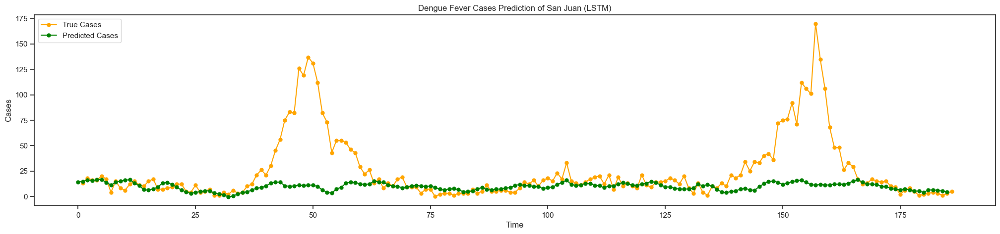

In [122]:
# Train model for San Juan city
sj_trained_lstm_model = build_lstm_model(X_train_sj, y_train_sj, 50, 50, 64, 0.001, X_test_sj, y_test_sj)

sj_predicted_cases = sj_trained_lstm_model.predict(X_test_sj)
sj_predicted_cases = scaler.inverse_transform(sj_predicted_cases)

sj_rmse = evaluate_lstm(sj_predicted_cases, y_test_val_sj, "San Juan")

Epoch 1/100


/Users/steffijiang/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1434 - val_loss: 0.0391
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0307 - val_loss: 0.0136
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0182 - val_loss: 0.0110
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0100 - val_loss: 0.0065
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0094 - val_loss: 0.0076
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0120 - val_loss: 0.0066
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0104 - val_loss: 0.0068
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0089 - val_loss: 0.0075
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0095 - val_loss: 0.0071
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0086 - val_loss: 0.0065
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0100 - val_loss: 0.0064
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0088 - val_loss: 0.0064
E

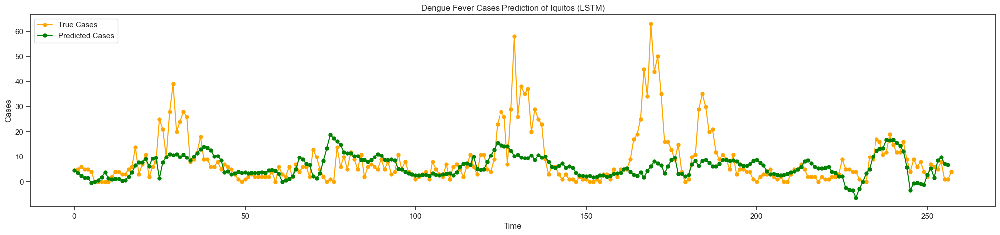

In [98]:
# Train model for Iquitos city
iq_trained_lstm_model = build_lstm_model(X_train_iq, y_train_iq, 100, 50, 64, 0.01, X_test_iq, y_test_iq)

iq_predicted_cases = iq_trained_lstm_model.predict(X_test_iq)
iq_predicted_cases = scaler.inverse_transform(iq_predicted_cases)

iq_rmse = evaluate_lstm(iq_predicted_cases, y_test_val_iq, "Iquitos")

# This part was created by Weiyi Sun

### 5.2 Random Forest

In [88]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
import matplotlib.pyplot as plt

def split_data_rf(features, target, train_size):
    train_number = int(len(features)*train_size)
    X_train = features[:train_number]
    y_train = target[:train_number]

    X_test = features[train_number:]
    y_test = target[train_number:]
    y_test_val = target[train_number:]
    return X_train, y_train, X_test, y_test, y_test_val

def build_random_forest(X_train, y_train, n_estimators, max_depth):
    """
    Builds a Random Forest Regression model with specified parameters.

    Args:
        X_train (numpy.ndarray): Training features.
        y_train (numpy.ndarray): Training labels.
        n_estimators (int, optional): Number of decision trees in the forest. Defaults to 100.
        max_depth (int, optional): Maximum depth of each tree. Defaults to 5.

    Returns:
        RandomForestRegressor: The trained Random Forest model.
    """
    model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth)
    model.fit(X_train, y_train)
    return model

def evaluate_random_forest(model, X_test, y_test, city):
    """
    Evaluates the model's performance using RMSE.

    Args:
        model (RandomForestRegressor): The trained Random Forest model.
        X_test (numpy.ndarray): Testing features.
        y_test (numpy.ndarray): Testing labels.

    Returns:
        float: The Root Mean Squared Error (RMSE) of the model.
    """
    predictions = model.predict(X_test)
    # predictions = scaler.inverse_transform(predictions) 
    rmse = sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    print("MAE:", mae)
    print("RMSE:", rmse)
    y_test.index = range(1, len(y_test) + 1) 
    plot_rf_prediction(y_test, predictions, city)

def plot_rf_prediction(test, predicted, city):
    """
    Plot the actual vs. predicted dengue fever cases for a specified city.

    Parameters:
    test : The actual dengue fever cases.
    predicted : The predicted dengue fever cases from the model.
    city : The name of the city being evaluated, used for labeling the plot.

    Returns:
    None
    """
    plt.figure(figsize=(25, 5))
    plt.title('Dengue Fever Cases Prediction of ' + city + ' (Random Forest)')
    plt.xlabel('Time')
    plt.ylabel('Cases')
    plt.plot(test, color='orange', label='Real Cases', marker='o', markersize=5)
    plt.plot(predicted, color='green', label='Predicted Cases', marker='o', markersize=5)
    plt.legend(loc='upper left')
    plt.show()

MAE: 27.06132434517396
RMSE: 38.68393900308673


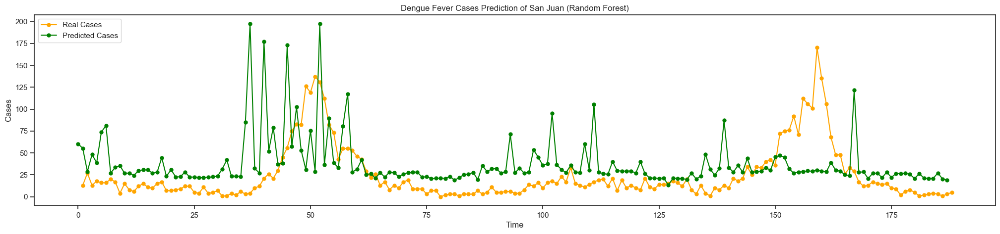

In [89]:
# Split dataset
X_train_rdf_sj, y_train_rdf_sj, X_test_rdf_sj, y_test_rdf_sj, y_test_val_rdf_sj = split_data_rf(
    sj_rfe_features, sj_target, 0.8)
# Build the model
sj_rdf_model = build_random_forest(X_train_rdf_sj, y_train_rdf_sj, 100, 5)
# Evaluate performance
evaluate_random_forest(sj_rdf_model, X_test_rdf_sj, y_test_rdf_sj, "San Juan")

MAE: 7.000636962452423
RMSE: 11.45694911007212


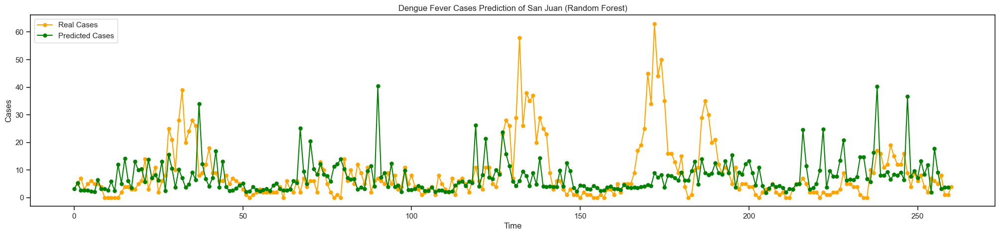

In [90]:
# Split dataset
X_train_rdf_iq, y_train_rdf_iq, X_test_rdf_iq, y_test_rdf_iq, y_test_val_rdf_iq = split_data_rf(
    iq_rfe_features, iq_target, 0.5)
# Build the model
iq_rdf_model = build_random_forest(X_train_rdf_iq, y_train_rdf_iq, 100, 5)
# Evaluate performance
evaluate_random_forest(iq_rdf_model, X_test_rdf_iq, y_test_rdf_iq, "San Juan")

### 5.3 Linear Regression

In [91]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt

def lr_model(x_train, y_train, x_test, y_test, city):
    """
    Build, train, and evaluate a Linear Regression model for predicting dengue fever cases,
    and plot the comparison of actual and predicted values.

    Parameters:
    x_train : Training input data.
    y_train : Training target data.
    x_test : Testing input data.
    y_test : Testing target data.
    city (str): The name of the city being evaluated, used for labeling the plot.

    Returns:
    None
    """
    
    regr_model = LinearRegression()
    regr_model.fit(x_train,y_train)
    y_pred = regr_model.predict(x_test)
    print(cross_val_score(regr_model,x_test,y_test,scoring='neg_mean_absolute_error', cv=3))
    print(f'LR MAE: {mean_absolute_error(y_test,y_pred,multioutput="uniform_average")}')
    print(f'LR RMSE: {sqrt(mean_squared_error(y_test,y_pred,multioutput="uniform_average"))}')

    y_test.index = range(1, len(y_test) + 1) 
    plt.figure(figsize=(25, 5))
    plt.title(f'Dengue Fever Cases Prediction of {city} (Liner Regression)')
    plt.xlabel('Time')
    plt.ylabel('Cases')
    plt.plot(y_test, color='orange', label='Real Cases', marker='o', markersize=5)
    plt.plot(y_pred, color='green', label='Predicted Cases', marker='o', markersize=5)
    plt.legend(loc='upper left')
    plt.show()

[-21.90575738 -25.06013476 -24.03744173]
LR MAE: 27.25270698788511
LR RMSE: 34.17953206163978


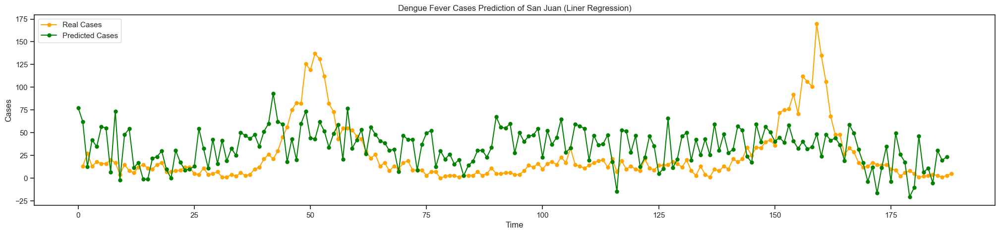

In [92]:
lr_model(X_train_rdf_sj, y_train_rdf_sj, X_test_rdf_sj, y_test_rdf_sj, 'San Juan')

[-6.30244412 -8.8790205  -6.19161243]
LR MAE: 6.1741723212763855
LR RMSE: 10.118888682816625


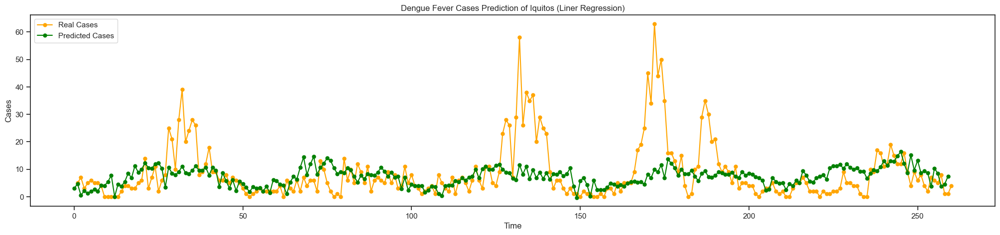

In [93]:
lr_model(X_train_rdf_iq, y_train_rdf_iq, X_test_rdf_iq, y_test_rdf_iq, 'Iquitos')

# The following codes were created by Zichao An

## Step 6: Xgboost

### 6.1  Data Preprocessing

In [2]:
import numpy as np
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
from xgboost import plot_importance


def preprocess_data(data_path, labels_path=None):
    # load data and set index to city, year, weekofyear
    df = pd.read_csv(data_path)
    
    # fill missing values
    # try instead using mean and median
    df.fillna(method='bfill', inplace=True)
    

    # add labels to dataframe
    if labels_path:
        labels = pd.read_csv(labels_path)
    
    # separate san juan and iquitos
    sj_features = df[df.city == 'sj']
    iq_features = df[df.city == 'iq']
    
    #dropping date and city as city already divided
    iq_features = iq_features.drop(iq_features.columns[[0,3]], axis=1)
    sj_features = sj_features.drop(sj_features.columns[[0,3]], axis=1)


    if labels_path:
        sj_labels = labels[labels.city == 'sj']
        iq_labels = labels[labels.city == 'iq']   
        #removing city, year, weekofyear from labels tables
        sj_labels = sj_labels.total_cases
        iq_labels = iq_labels.total_cases
        return sj_features, iq_features, sj_labels, iq_labels
    return sj_features, iq_features

### 6.2 load data

In [33]:
sj_features, iq_features, sj_labels, iq_labels = preprocess_data('data/dengue_features_train.csv',labels_path="data/dengue_labels_train.csv")
#load final test data
sj_test_final, iq_test_final = preprocess_data("data/dengue_features_test.csv")

In [19]:
sj_features.head()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


### 6.3 feature importance plot

(936, 3)


E:\ana\Lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


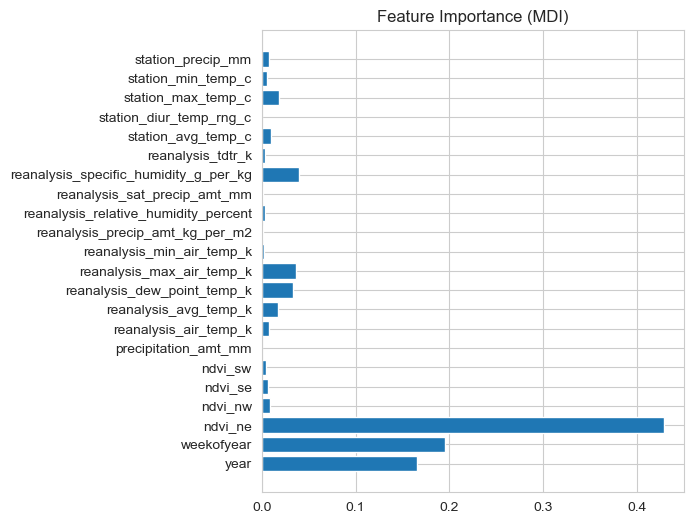

In [20]:
#add lagging variables to most significant variables
Cols = sj_features.columns.values.tolist()

clf = GradientBoostingRegressor(random_state=1001)

selector = clf.fit(sj_features, sj_labels)
importances = selector.feature_importances_
sorted_idx = np.argsort(importances)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, importances, align="center")
plt.yticks(pos, sj_features)
plt.title("Feature Importance (MDI)")
fs = SelectFromModel(selector, prefit=True)
train = fs.transform(sj_features)
print(train.shape)

### 6.4 split data

In [21]:
sj_train, sj_test, sj_train_target, sj_test_target = train_test_split(sj_features, sj_labels, test_size=0.2, random_state=41)

iq_train, iq_test, iq_train_target, iq_test_target = train_test_split(iq_features, iq_labels, test_size=0.2, random_state=41)

### 6.5 Xgboost Model for SJ

In [22]:
def xboostRegressorSJ(city_feat, city_labels):
    '''
    this function builds a xboost model given a city
    '''        
    xgbr = xgb.XGBRegressor(n_estimators = 750, # number of boosted trees
                                learning_rate = 0.1, # step size shrinkage used in update to prevent overfitting
                                max_depth = 10,
                                subsample = 0.75, # subsample ratio of the training set (Stochastic gradient boosting)
                                colsample_bytree = 0.75,
                               gamma = .025)
    xgbr.fit(city_feat,city_labels)
    return xgbr

sj_model = xboostRegressorSJ(sj_train, sj_train_target)

SJ MAE : 13.425182474420426


<Figure size 640x480 with 0 Axes>

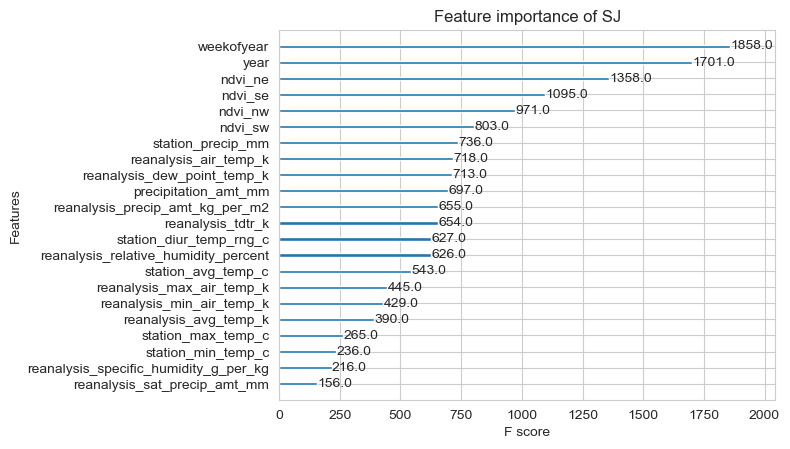

In [23]:
pred = sj_model.predict(sj_test)
score = metrics.mean_absolute_error(sj_test_target,pred)
print("SJ MAE :",score)
fig1=plt.gcf()
plot_importance(sj_model)
plt.title("Feature importance of SJ")
plt.draw()

### 6.6 Xgboost Model for IQ

In [24]:
def xboostRegressorIQ(city_feat, city_labels):
    '''
    this function builds a xboost model given a city
    '''        
    xgbr = xgb.XGBRegressor(n_estimators = 750, # number of boosted trees
                                learning_rate = 0.15, # step size shrinkage used in update to prevent overfitting
                                max_depth = 7,
                                subsample = 0.85, # subsample ratio of the training set (Stochastic gradient boosting)
                                colsample_bytree = 0.75,
                               gamma = .025)
    xgbr.fit(city_feat,city_labels)
    return xgbr
iq_model = xboostRegressorIQ(iq_train, iq_train_target)

IQ MAE : 6.0049228153925815


<Figure size 640x480 with 0 Axes>

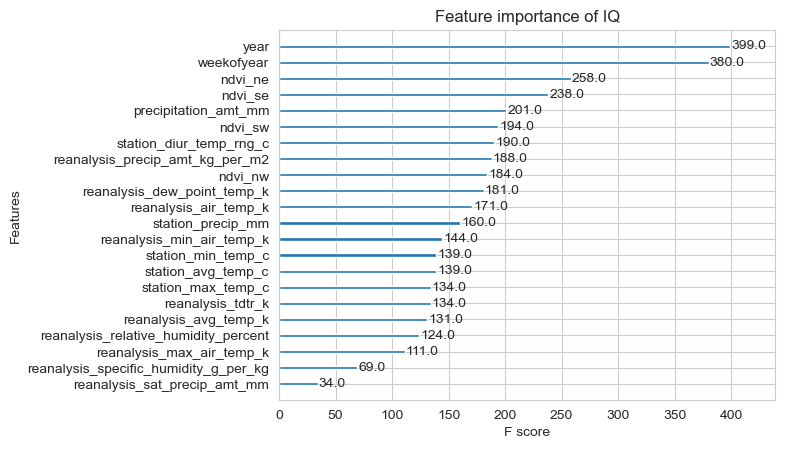

In [25]:
pred = iq_model.predict(iq_test)
score = metrics.mean_absolute_error(iq_test_target,pred)
print("IQ MAE :",score)
fig1=plt.gcf()
plot_importance(iq_model)
plt.title("Feature importance of IQ")
plt.draw()

### 6.7 treat test data and save

In [29]:
final_sj_predictions = sj_model.predict(sj_test_final)
final_iq_predictions = iq_model.predict(iq_test_final)

submission = pd.read_csv("data/dengue_labels_test.csv",
                         index_col=[0, 1, 2])
submission.total_cases = np.concatenate([final_sj_predictions.astype(np.int64), final_iq_predictions.astype(np.int64)])
submission.to_csv("submission/submission_xgboost.csv")

## Step 7: Multilayer perceptron

In [30]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import numpy as np
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split


Instructions for updating:
non-resource variables are not supported in the long term


### 7.1 data preprocessing

In [32]:
# make function to preprocess data
def preprocess_data(data_path, labels_path=None):
    
    df = pd.read_csv(data_path)
    
    df.fillna(method='ffill', inplace=True)

    # add labels to dataframe
    if labels_path:
        labels = pd.read_csv(labels_path)
    
    # separate san juan and iquitos
    sj_features = df[df.city == 'sj']
    iq_features = df[df.city == 'iq']
    if labels_path:
        sj_labels = labels[labels.city == 'sj']
        iq_labels = labels[labels.city == 'iq']    
        return sj_features, iq_features, sj_labels, iq_labels
    return sj_features, iq_features

In [34]:
sj_features, iq_features, sj_labels, iq_labels = preprocess_data('data/dengue_features_train.csv',labels_path="data/dengue_labels_train.csv")

#load final test data
sj_test_final, iq_test_final = preprocess_data("data/dengue_features_test.csv")

In [35]:
#dropping date and city as city already divided

iq_features = iq_features.drop(iq_features.columns[[0,3]], axis=1)
sj_features = sj_features.drop(sj_features.columns[[0,3]], axis=1)
sj_test_final = sj_test_final.drop(sj_test_final.columns[[0,3]], axis=1)
iq_test_final = iq_test_final.drop(iq_test_final.columns[[0,3]], axis=1)

#removing city, year, weekofyear from labels tables
sj_labels = sj_labels.total_cases
iq_labels = iq_labels.total_cases


sj_labels.head()

0    4
1    5
2    4
3    3
4    6
Name: total_cases, dtype: int64

### 7.2 split data

In [36]:
#split train and test data
sj_train = sj_features.head(800)
sj_train_target = sj_labels.head(800)
sj_test = sj_features.tail(sj_features.shape[0] - 800)
sj_test_target = sj_labels.tail(sj_labels.shape[0] - 800)



iq_train = iq_features.head(400)
iq_train_target = iq_labels.head(400)
iq_test = iq_features.tail(iq_features.shape[0] - 400)
iq_test_target = iq_labels.tail(iq_labels.shape[0] - 400)

In [37]:
#randomly separating data
sj_train, sj_test, sj_train_target, sj_test_target = train_test_split(sj_features, sj_labels, test_size=0.2, random_state=41)

iq_train, iq_test, iq_train_target, iq_test_target = train_test_split(iq_features, iq_labels, test_size=0.2, random_state=41)

In [38]:
sj_train.head()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
75,1991,41,0.09300,0.093000,0.145083,0.168167,32.10,299.562857,299.671429,295.887143,...,55.10,80.515714,32.10,17.344286,2.257143,27.657143,6.614286,31.7,22.8,8.3
119,1992,33,0.16395,0.126650,0.215057,0.219271,65.55,299.215714,299.221429,296.007143,...,81.80,82.750000,65.55,17.415714,1.957143,27.671429,7.557143,31.7,22.8,41.9
882,2007,16,0.06890,0.044267,0.108357,0.085029,0.00,299.335714,299.557143,294.507143,...,2.22,74.832857,0.00,15.854286,3.000000,27.728571,8.014286,33.3,22.8,1.8
319,1996,25,0.07125,0.064600,0.146100,0.156171,47.93,298.490000,298.564286,295.435714,...,73.70,83.322857,47.93,16.810000,1.928571,26.442857,5.800000,30.6,22.8,84.6
693,2003,35,0.07260,0.100000,0.204371,0.160357,98.68,300.668571,300.728571,297.048571,...,50.86,80.797143,98.68,18.571429,2.542857,27.914286,6.457143,31.7,23.3,69.6


In [39]:
sj_train_target.head()

75     116
119     30
882      4
319      6
693     32
Name: total_cases, dtype: int64

### 7.3 MLP Model

In [40]:
def init_weights(shape): 
    weights = tf.random.normal(shape, stddev=0.1)
    return tf.Variable(weights)

In [41]:
def forwardprop(X, w_1, w_2, w_3):
    h    = tf.nn.sigmoid(tf.matmul(X, w_1))  # The \sigma function
    h2 = tf.nn.sigmoid(tf.matmul(h, w_2))
    yhat = tf.matmul(h2, w_3)  # The \varphi function
    return yhat

In [42]:
x_size = sj_train.shape[1]   # Number of input nodes
h_size = 256                # Number of hidden nodes
y_size = 1   # Number of outcomes (3 iris flowers)

In [43]:
# Symbols
tf.compat.v1.disable_eager_execution()
X = tf.compat.v1.placeholder("float", shape=[None, x_size])
y = tf.compat.v1.placeholder("float", shape=[None, y_size])

In [44]:
# Weight initializations
w_1 = init_weights((x_size, h_size))
w_2 = init_weights((h_size, h_size))
w_3 = init_weights((h_size, y_size))

In [45]:
# Forward propagation
yhat    = forwardprop(X, w_1, w_2, w_3)
predict = tf.cast(yhat,tf.int64)

In [46]:
# Backward propagation
cost    = tf.keras.losses.mean_squared_error(y, yhat)
updates = tf.train.GradientDescentOptimizer(0.00000003).minimize(cost)

In [47]:
# transposing labels so that it works in tensorflow
sj_train_target = sj_train_target.to_numpy()
iq_train_target = iq_train_target.to_numpy()

sj_train_target = sj_train_target[:, None]
iq_train_target = iq_train_target[:, None]

sj_test_target = sj_test_target.to_numpy()
iq_test_target = iq_test_target.to_numpy()

sj_test_target = sj_test_target[:, None]
iq_test_target = iq_test_target[:, None]

In [48]:
# Run SGD
sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)

### 7.4 MLP for SJ

In [49]:
for epoch in range(180):
        # Train with each example
        for i in range(len(sj_train)):
            sess.run(updates, feed_dict={X: sj_train[i: i + 1], y: sj_train_target[i: i + 1]})

        train_MAE = metrics.mean_absolute_error(sj_train_target,
                                                     sess.run(predict, feed_dict={X: sj_train}))
        test_MAE  = metrics.mean_absolute_error(sj_test_target,
                                                     sess.run(predict, feed_dict={X: sj_test}))

        if epoch % 10 == 0 or epoch == 179:
            print("Epoch = %d, train loss = %.2f, test loss = %.2f"
                  % (epoch + 1, train_MAE, test_MAE))
#run model on final test data
sj_predictions = sess.run(predict, feed_dict={X: sj_test_final})

Epoch = 1, train loss = 35.17, test loss = 30.25
Epoch = 11, train loss = 34.18, test loss = 29.26
Epoch = 21, train loss = 33.21, test loss = 28.28
Epoch = 31, train loss = 31.47, test loss = 26.54
Epoch = 41, train loss = 30.68, test loss = 25.73
Epoch = 51, train loss = 29.94, test loss = 24.99
Epoch = 61, train loss = 29.29, test loss = 24.36
Epoch = 71, train loss = 28.70, test loss = 23.80
Epoch = 81, train loss = 28.16, test loss = 23.30
Epoch = 91, train loss = 27.25, test loss = 22.48
Epoch = 101, train loss = 26.86, test loss = 22.12
Epoch = 111, train loss = 26.52, test loss = 21.83
Epoch = 121, train loss = 26.23, test loss = 21.62
Epoch = 131, train loss = 26.23, test loss = 21.59
Epoch = 141, train loss = 26.00, test loss = 21.43
Epoch = 151, train loss = 25.81, test loss = 21.30
Epoch = 161, train loss = 25.67, test loss = 21.23
Epoch = 171, train loss = 25.60, test loss = 21.26
Epoch = 180, train loss = 25.57, test loss = 21.34


In [50]:
sess.close()

In [51]:
# reset session
sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)

### 7.5 MLP Model for IQ

In [52]:
for epoch in range(180):
        # Train with each example
        for i in range(len(iq_train)):
            sess.run(updates, feed_dict={X: iq_train[i: i + 1], y: iq_train_target[i: i + 1]})

        train_MAE = metrics.mean_absolute_error(iq_train_target,
                                                     sess.run(predict, feed_dict={X: iq_train}))
        test_MAE  = metrics.mean_absolute_error(iq_test_target,
                                                     sess.run(predict, feed_dict={X: iq_test}))

        if epoch % 10 == 0 or epoch == 179:
            print("Epoch = %d, train loss = %.2f, test loss = %.2f"
                  % (epoch + 1, train_MAE, test_MAE))
#run model on final test data
iq_predictions = sess.run(predict, feed_dict={X: iq_test_final})

Epoch = 1, train loss = 7.33, test loss = 8.49
Epoch = 11, train loss = 7.33, test loss = 8.49
Epoch = 21, train loss = 6.69, test loss = 7.91
Epoch = 31, train loss = 6.69, test loss = 7.91
Epoch = 41, train loss = 6.69, test loss = 7.91
Epoch = 51, train loss = 6.69, test loss = 7.91
Epoch = 61, train loss = 6.69, test loss = 7.91
Epoch = 71, train loss = 6.69, test loss = 7.91
Epoch = 81, train loss = 6.28, test loss = 7.44
Epoch = 91, train loss = 6.25, test loss = 7.41
Epoch = 101, train loss = 6.25, test loss = 7.41
Epoch = 111, train loss = 6.25, test loss = 7.41
Epoch = 121, train loss = 6.25, test loss = 7.41
Epoch = 131, train loss = 6.25, test loss = 7.41
Epoch = 141, train loss = 6.25, test loss = 7.41
Epoch = 151, train loss = 6.25, test loss = 7.41
Epoch = 161, train loss = 6.25, test loss = 7.41
Epoch = 171, train loss = 5.97, test loss = 7.20
Epoch = 180, train loss = 5.97, test loss = 7.20


In [53]:
sess.close()

### 7.6 saving result

In [54]:
submission = pd.read_csv("data/dengue_labels_test.csv",
                         index_col=[0, 1, 2])

submission.total_cases = np.concatenate([sj_predictions, iq_predictions])
submission.to_csv("submission/submission_MLP.csv")
